# Complete Analysis Pipeline: ZCI Computation (Streamlined)

This notebook implements the complete **Zoobenthic Community Indicator (ZCI)** analysis pipeline with a **simplified parameter structure**.

## Parameter Organization

### KEY_PARAMS (Core Parameters Only)
- **Stage 1**: `transform_method`, `pc_weights`, `standardize_pca_scores`, `rda_percentile_threshold`
- **Stage 2**: `reference_percentile`, `species_transformation`, `n_clusters`, `env_variables`
- **Stage 3**: `taxa_transformation`, `lda_log_transform_env`
- **Stage 4**: `taxa_transformation`, `training_percentile`, `least_pollution_threshold`, `zci_pc_planes`, `normalize_pcs`, `pc_plane`, `custom_ref_sites`

### OTHER_PARAMS (Optional/Default Parameters)
- Passed as `**kwargs` dictionaries to pipeline functions
- Contains visualization, model, and output settings

---

## Pipeline Stages

1. **Stage 1: Contamination Assessment** - PCA-based pollution scoring
2. **Stage 2: Taxa Assemblage on Reference Sites** - Hierarchical clustering of species
3. **Stage 3: Environment-Driven Taxa Clusters** - RDA + LDA classification
4. **Stage 4: Community Composition Ordination** - ZCI computation and visualization

In [1]:
# =============================================================================
# IMPORTS AND SETUP
# =============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from datetime import datetime

warnings.filterwarnings('ignore')

print("✓ Base imports loaded successfully!")

✓ Base imports loaded successfully!


## Configuration: Data & Output Paths

In [2]:
# =============================================================================
# DATA & OUTPUT CONFIGURATION
# =============================================================================

# Generate timestamp for this run
RUN_TIMESTAMP = datetime.now().strftime("%m_%d_%H_%M")

# -----------------------------------------------------------------------------
# DATA PARAMETERS
# -----------------------------------------------------------------------------
DATA_PARAMS = {
    'data_path': "../data/processed/complete_env_taxa_chemical.xlsx",
    'sheet_name': "all_data_merged",
    'pollution_column': 'Pollution_Score',
    'cluster_column': 'clusters',
    'ref_column': 'if_ref',
}

# -----------------------------------------------------------------------------
# OUTPUT PARAMETERS
# -----------------------------------------------------------------------------
RESULTS_DIR = "../results"

OUTPUT_PARAMS = {
    'save_figures': True,
    'save_tables': True,
    'save_parameters': True,
    'figure_formats': ['png'],
    'figure_dpi': 300,
    'timestamp': RUN_TIMESTAMP,
}

# Construct paths for each stage
FIGURE_PATHS = {
    1: f"{RESULTS_DIR}/figures/01_contamination_assessment",
    2: f"{RESULTS_DIR}/figures/02_taxa_assemblage_in_refs",
    3: f"{RESULTS_DIR}/figures/03_env_driven_taxa_clusters",
    4: f"{RESULTS_DIR}/figures/04_community_composition_measures",
}

TABLE_PATHS = {
    1: f"{RESULTS_DIR}/tables/01_contamination_assessment",
    2: f"{RESULTS_DIR}/tables/02_taxa_assemblage_in_refs",
    3: f"{RESULTS_DIR}/tables/03_env_driven_taxa_clusters",
    4: f"{RESULTS_DIR}/tables/04_community_composition_measures",
}

print("✓ Data & Output configuration complete")
print(f"  - Run timestamp: {RUN_TIMESTAMP}")
print(f"  - Results directory: {RESULTS_DIR}")

✓ Data & Output configuration complete
  - Run timestamp: 01_22_01_11
  - Results directory: ../results


## KEY_PARAMS: Core Parameters (Explicitly Set)

Only the **essential parameters** that users typically modify are set here.
All other parameters use default values via `OTHER_PARAMS` dictionaries.

In [3]:
# =============================================================================
# KEY PARAMETERS - CORE PARAMETERS ONLY
# =============================================================================
# These are the essential parameters that define the analysis.
# Each stage has only the most important, frequently-modified parameters.
# =============================================================================

KEY_PARAMS = {
    # =========================================================================
    # STAGE 1: Contamination Assessment
    # =========================================================================
    'stage1': {
        'transform_method': 'log_z_score',      # 'log_z_score' or 'robust_scaler'
        'pc_weights': {
            'PC1': 1.0, 'PC2': 1.0, 'PC3': 1.0,
            'PC4': 0.0, 'PC5': 1.0, 'PC6': 1.0,
        },
        'standardize_pca_scores': True,         # Whether to standardize PC scores
        'rda_percentile_threshold': 40,         # Threshold for RDA validation
    },
    
    # =========================================================================
    # STAGE 2: Taxa Assemblage on Reference Sites
    # =========================================================================
    'stage2': {
        'reference_percentile': 50,             # Bottom X% as reference sites
        'species_transformation': 'hellinger',  # 'hellinger', 'chord', 'octave'
        'n_clusters': 2,                        # Number of habitat clusters
        'env_variables': [                      # Environmental variables for analysis
            'Measured Depth (m)',
            'Velocity  at bottom (m/sec)_Imputed',
            'Water DO Bottom (mg/L)',
            'Temperature (oC)',
            'MPS (Phi)',
            'LOI (%)'
        ],
    },
    
    # =========================================================================
    # STAGE 3: Environment-Driven Taxa Clusters (RDA + LDA)
    # =========================================================================
    'stage3': {
        'taxa_transformation': 'hellinger',     # Taxa transformation for RDA
        'lda_log_transform_env': False,         # Whether to log-transform env vars for LDA
    },
    
    # =========================================================================
    # STAGE 4: Community Composition Ordination (PCA-based ZCI)
    # =========================================================================
    'stage4': {
        'taxa_transformation': 'hellinger',     # Taxa transformation for PCA
        'training_percentile': 100.0,        # Training percentile (100 = all sites)
        'least_pollution_threshold': 15,       # Reference percentile for ZCI centroid
        'zci_pc_planes': None,                  # {cluster_id: (pc1, pc2, ...)} or None
        'normalize_pcs': False,                 # Whether to normalize species PCs
        'pc_plane': (1, 2),                     # PC axes for ordination plot
        'custom_reference_sites': None,               # {cluster_id: [site_ids]} or None (auto)
    },
    
    # =========================================================================
    # GENERAL SETTINGS
    # =========================================================================
    'verbose': True,
    'random_state': 42,
}

print("=" * 80)
print("✓ KEY PARAMETERS CONFIGURED")
print("=" * 80)
for stage in ['stage1', 'stage2', 'stage3', 'stage4']:
    params = KEY_PARAMS[stage]
    print(f"\n{stage.upper()}:")
    for key, val in params.items():
        if isinstance(val, dict) and len(val) > 3:
            print(f"  - {key}: {{ {len(val)} items }}")
        elif isinstance(val, list) and len(val) > 3:
            print(f"  - {key}: [ {len(val)} items ]")
        else:
            print(f"  - {key}: {val}")

✓ KEY PARAMETERS CONFIGURED

STAGE1:
  - transform_method: log_z_score
  - pc_weights: { 6 items }
  - standardize_pca_scores: True
  - rda_percentile_threshold: 40

STAGE2:
  - reference_percentile: 50
  - species_transformation: hellinger
  - n_clusters: 2
  - env_variables: [ 6 items ]

STAGE3:
  - taxa_transformation: hellinger
  - lda_log_transform_env: False

STAGE4:
  - taxa_transformation: hellinger
  - training_percentile: 100.0
  - least_pollution_threshold: 15
  - zci_pc_planes: None
  - normalize_pcs: False
  - pc_plane: (1, 2)
  - custom_reference_sites: None


## OTHER_PARAMS: Optional/Default Parameters

These parameters are passed as `**kwargs` to pipeline functions.
They contain visualization, model, and advanced settings with sensible defaults.

In [4]:
# =============================================================================
# OTHER PARAMETERS - OPTIONAL/DEFAULT SETTINGS (Passed as **kwargs)
# =============================================================================
# These parameters have sensible defaults and are rarely modified.
# They are passed to pipeline functions using **OTHER_PARAMS[stage]
# =============================================================================

OTHER_PARAMS = {
    # =========================================================================
    # STAGE 1: Additional Parameters
    # =========================================================================
    'stage1': {
        # Model settings
        'run_rda_validation': True,
        'save_individual_pcs': True,
        # Output settings (handled by save_path args)
    },
    
    # =========================================================================
    # STAGE 2: Additional Parameters
    # =========================================================================
    'stage2': {
        # Model settings
        'top_n_taxa': 16,
        # ANOVA settings
        'run_boxcox_anova': True,
        'use_boxcox_transform': False,
        'anova_top_n_taxa': 16,
        # Visualization settings
        'create_cluster_visualization': True,
        'create_dendrogram_comparison': True,
        'create_ward_analysis': True,
        'create_comparison_plots': True,
        'label_positions': [90, 250, 380],
    },
    
    # =========================================================================
    # STAGE 3: Additional Parameters
    # =========================================================================
    'stage3': {
        # RDA settings
        'rda_log_transform_env': False,
        'rda_standardize_env': True,
        'rda_n_permutations': 999,
        'top_n_taxa': None,
        # LDA settings
        'lda_standardize_env': True,
        'lda_n_iterations': 1000,
        'lda_test_size': 0.2,
        # Visualization settings
        'rda_arrow_scale': 0.5,
        'rda_species_scale': 0.5,
        'rda_figsize': (14, 10),
        'lda_arrow_scale': 2,
        'lda_cv_figsize': (14, 9),
    },
    
    # =========================================================================
    # STAGE 4: Additional Parameters
    # =========================================================================
    'stage4': {
        # Model settings
        'variance_threshold': 0.70,
        'pc_variance_threshold': 5.0,
        'pollution_pc_prefix': 'Pollution_PC',
        'use_consistent_taxa_order': True,
        'zci_method': 'least_pollution_threshold',
        # Visualization toggles
        'create_taxa_loadings_plot': False,
        'create_pc_loadings_plot': False,
        'create_ordination_plot': True,
        'create_zci_plot': True,
        'create_pc_regression_plot': True,
        'create_pollution_vs_species_pc_plot': True,
        'create_comprehensive_plot': False,
        'create_pc_ridge_plot': False,
        # Visualization style
        'top_n_taxa': 16,
        'pc_loadings_top_n_taxa': None,
        'pc_loadings_show_values': False,
        'taxa_loadings_pcs': {
            0: (1, 2, 3, 4, 5),
            1: (1, 2, 3, 4, 5, 6),
            2: (1, 2, 3, 4),
        },
        'taxa_loadings_figsize': (14, 12),
        'ordination_figsize': (18, 6),
        'zci_figsize': (16, 10),
        # Ordination style
        'ordination_show_centroid': True,
        'ordination_ellipse_method': 'custom_refs',
        'ordination_label_sites': False,
    },
}

print("✓ OTHER PARAMETERS CONFIGURED")
print(f"  - Stage 1: {len(OTHER_PARAMS['stage1'])} additional parameters")
print(f"  - Stage 2: {len(OTHER_PARAMS['stage2'])} additional parameters")
print(f"  - Stage 3: {len(OTHER_PARAMS['stage3'])} additional parameters")
print(f"  - Stage 4: {len(OTHER_PARAMS['stage4'])} additional parameters")

✓ OTHER PARAMETERS CONFIGURED
  - Stage 1: 2 additional parameters
  - Stage 2: 9 additional parameters
  - Stage 3: 12 additional parameters
  - Stage 4: 23 additional parameters


---

## Stage 1: Contamination Assessment

**Key Parameters**:
- `transform_method`: Transformation for pollution variables
- `pc_weights`: Weights for combining PCs into pollution score
- `standardize_pca_scores`: Whether to standardize PC scores
- `rda_percentile_threshold`: Threshold for RDA validation


STAGE 1: CONTAMINATION ASSESSMENT
✓ Loaded data: 104 sites, 59 variables
CONTAMINATION ASSESSMENT PIPELINE

[Step 1/7] Extracting and preparing pollution data...
  ✓ Extracted 30 pollution variables from 104 sites

[Step 2/7] Applying transformation (method: log_z_score)...
  ✓ Applied log transformation (except As, Bi)
  ✓ Applied z-score standardization

[Step 3/7] Ordering variables by hierarchical clustering...
  ✓ Variables reordered by similarity

[Step 4/7] Performing PCA on transformed pollution data...


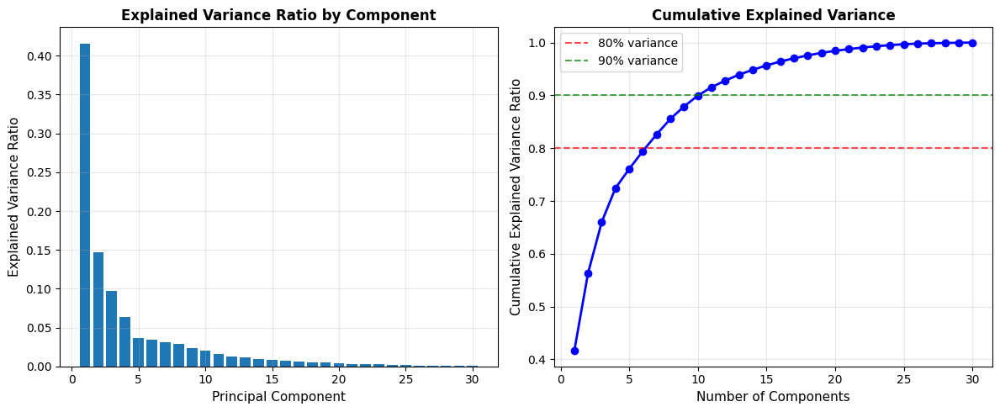

  ✓ Extracted 6 principal components
  ✓ PC loadings shape: (30, 6)
  ✓ PC scores shape: (104, 6)
  ✓ PC scores standardized (mean=0, std=1)

[Step 5/7] Creating visualizations...
  ✓ Ridge plot of PC loadings created

[Step 6/7] Running RDA validation (percentile threshold: 40)...
Hellinger transformation completed.
Original taxa data shape: (104, 16)

Percentile threshold: 40th percentile = -0.8306
Number of reference sites: 42
Number of contaminated sites: 62

Reference taxa data shape: (42, 16)
Reference habitat (PC scores) data shape: (42, 6)

Fitting RDA model...

✓ RDA triplot created successfully!
✓ RDA1 + RDA2 explain 58.95% of constrained variance
  ✓ RDA validation completed

[Step 7/7] Computing weighted pollution scores and merging into data...
  ✓ Using custom weights: {'PC1': 1.0, 'PC2': 1.0, 'PC3': 1.0, 'PC4': 0.0, 'PC5': 1.0, 'PC6': 1.0}
  ✓ Pollution scores added to data
  ✓ Multi-index column: ('pollution', 'weighted', 'SumRel')
  ✓ Raw data column: 'Pollution_Score'

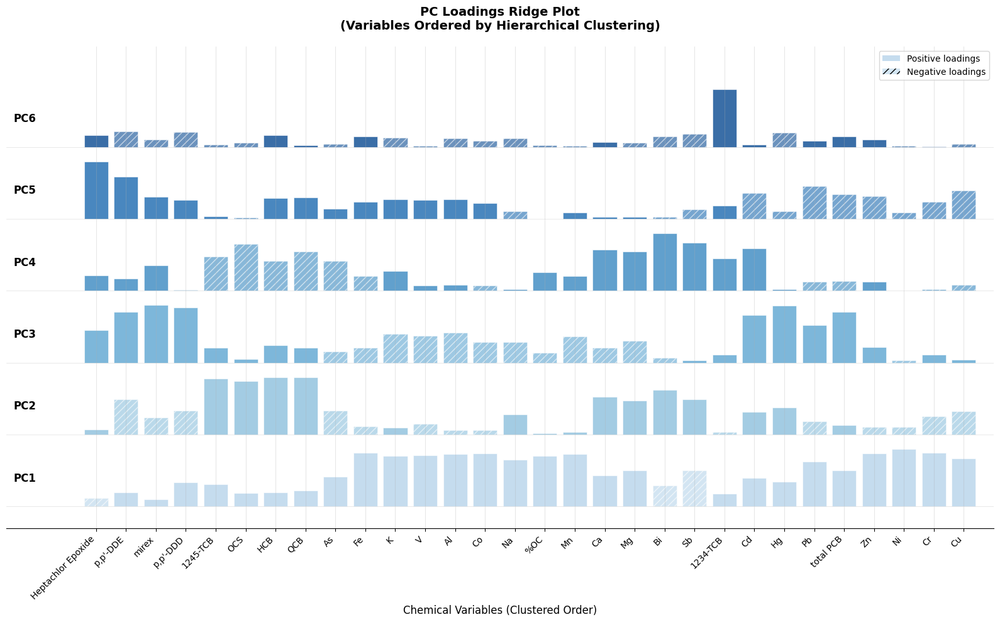

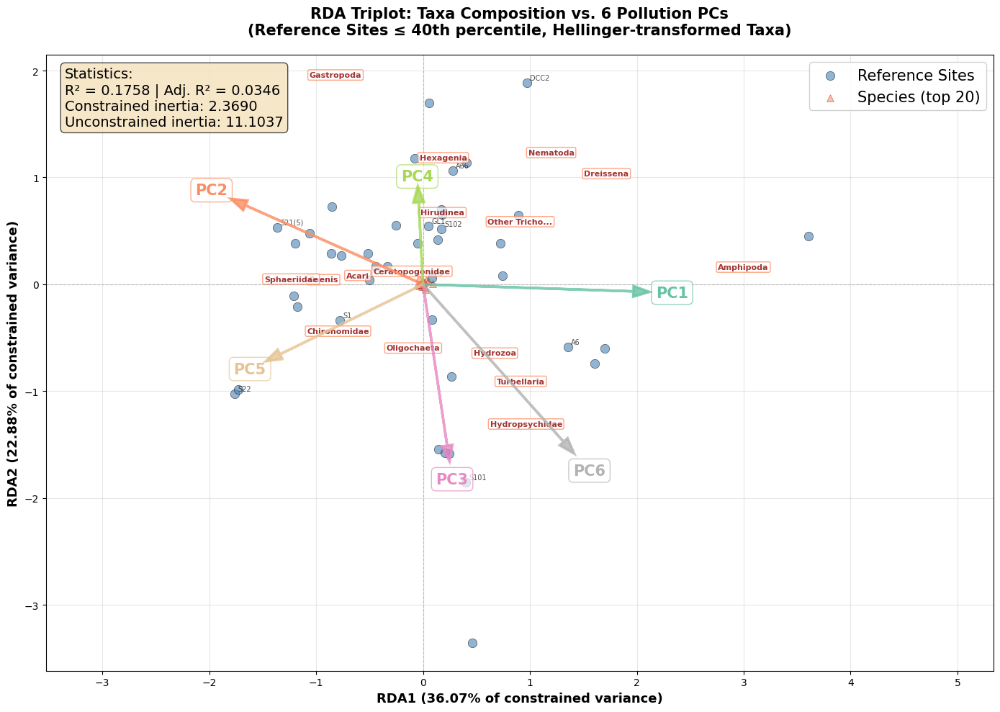

In [5]:
# =============================================================================
# STAGE 1: CONTAMINATION ASSESSMENT
# =============================================================================

print("\n" + "=" * 80)
print("STAGE 1: CONTAMINATION ASSESSMENT")
print("=" * 80)

# Load data
data_input = pd.read_excel(
    DATA_PARAMS['data_path'],
    sheet_name=DATA_PARAMS['sheet_name'],
    header=[0, 1, 2],
    index_col=0
)
print(f"✓ Loaded data: {data_input.shape[0]} sites, {data_input.shape[1]} variables")

# Reload module
import importlib
import sys
modules_to_remove = [key for key in sys.modules.keys() if 'zci.contamination_assessment' in key]
for mod in modules_to_remove:
    del sys.modules[mod]

from zci.contamination_assessment import pipeline as contamination_pipeline

# Get parameters
cfg_s1 = KEY_PARAMS['stage1']
other_s1 = OTHER_PARAMS['stage1']

# Save paths
save_path = FIGURE_PATHS[1] if OUTPUT_PARAMS['save_figures'] else None
table_save_path = TABLE_PATHS[1] if OUTPUT_PARAMS['save_tables'] else None

# Run pipeline with KEY_PARAMS explicitly, OTHER_PARAMS as kwargs
stage1_results = contamination_pipeline.contamination_assessment_pipeline(
    data_input,
    # --- KEY PARAMS (explicitly set) ---
    **cfg_s1,
    # --- OTHER PARAMS ---
    **other_s1,
    # --- OUTPUT ---
    save_path=save_path,
    save_tables=OUTPUT_PARAMS['save_tables'],
    table_save_path=table_save_path,
)

# Extract outputs
raw_data_s1 = stage1_results['raw_data']
multiindex_data_s1 = stage1_results['multiindex_data']

print(f"\n✓ Stage 1 Complete!")
print(f"  - Pollution scores range: [{raw_data_s1['Pollution_Score'].min():.2f}, {raw_data_s1['Pollution_Score'].max():.2f}]")
pollution_pc_cols = [c for c in raw_data_s1.columns if c.startswith('Pollution_PC')]
print(f"  - Pollution PCs: {pollution_pc_cols}")
if 'figures' in stage1_results and OUTPUT_PARAMS['save_figures']:
    print(f"  - Figures saved: {len(stage1_results['figures'])} to {save_path}")

---

## Stage 2: Taxa Assemblage on Reference Sites

**Key Parameters**:
- `reference_percentile`: Bottom X% of sites selected as reference
- `species_transformation`: Transformation for species data
- `n_clusters`: Number of habitat clusters
- `env_variables`: Environmental variables for analysis


STAGE 2: TAXA ASSEMBLAGE ON REFERENCE SITES
REFERENCE SITES TAXA ASSEMBLAGE PIPELINE

Configuration:
  - Reference percentile: 50%
  - Species transformation: hellinger
  - Linkage method: Ward's
  - Number of clusters: 2
  - Top taxa to display: 16
  - Run Box-Cox ANOVA: True
  - Save path: ../results/figures/02_taxa_assemblage_in_refs

STEP 1: Imputing velocity values...
VELOCITY IMPUTATION FOR SCDRS SITES

Detroit River baseline: 0.188 m/s (median of 18 sites)

[Lake St. Clair Imputation]
  LSC sites: 66
  Delta zone sites: 34
  Velocity range: -0.054 to 0.329 m/s
  Median velocity (all): 0.045 m/s
  Median velocity (delta): 0.094 m/s

[St. Clair River Imputation]
  SCR sites: 20
  Velocity range: 0.085 to 0.306 m/s
  Median velocity: 0.176 m/s
  Ratio to DR median: 0.94x

Creating visualizations...

IMPUTATION COMPLETED SUCCESSFULLY

Summary:
  Total sites: 104
  Sites with imputed values: 86
  Sites with recorded values: 18
  ✓ Velocity imputation complete

STEP 2: Selecting refe

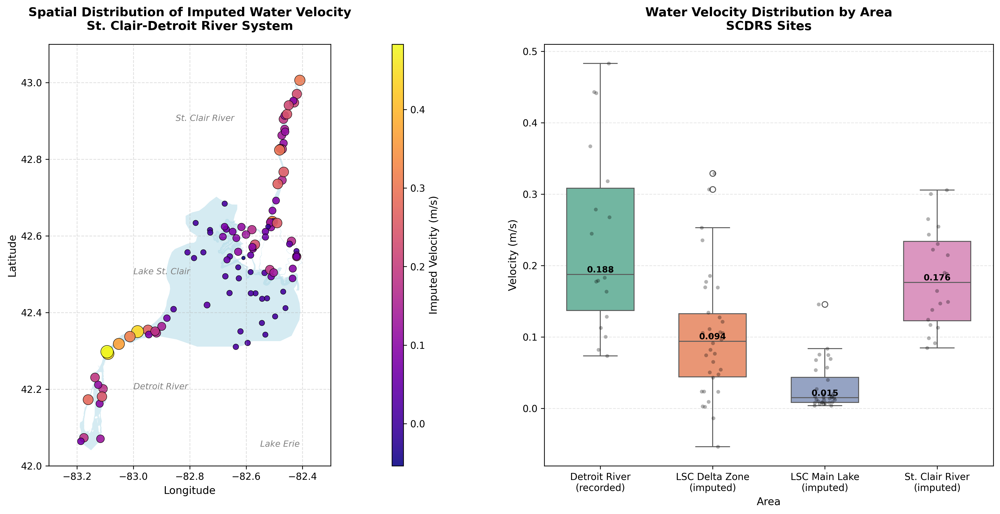

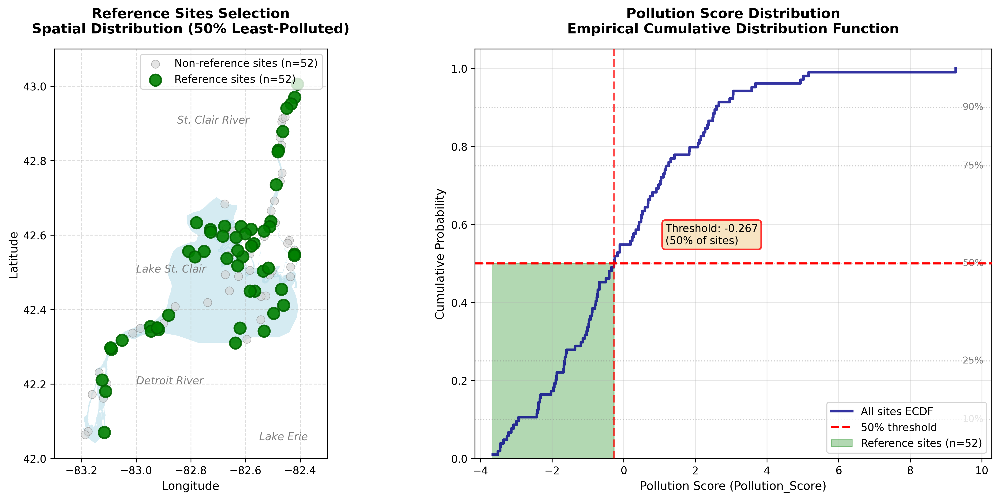

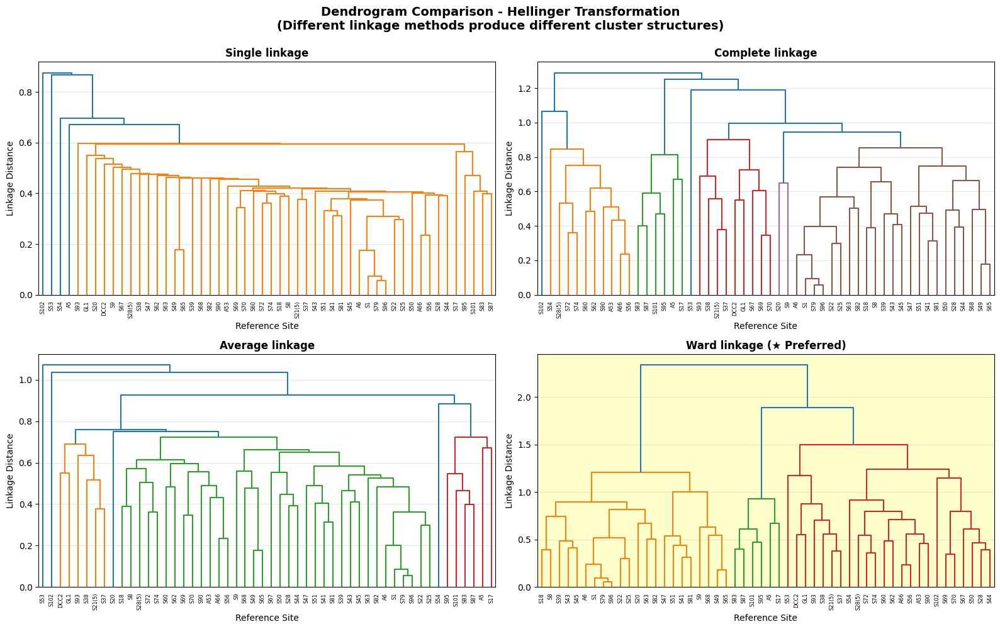

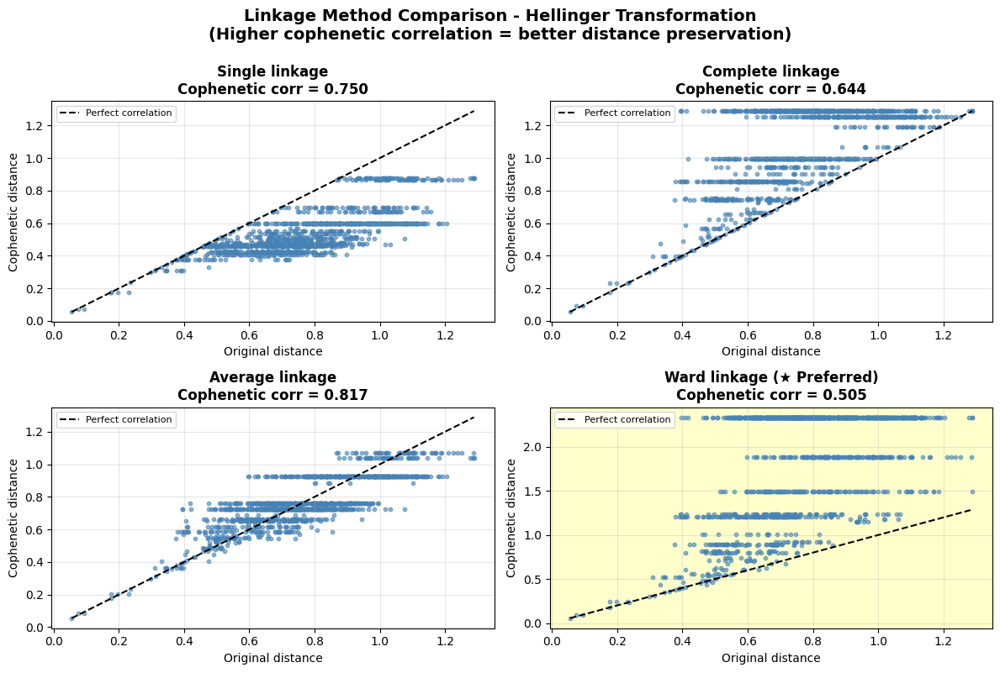

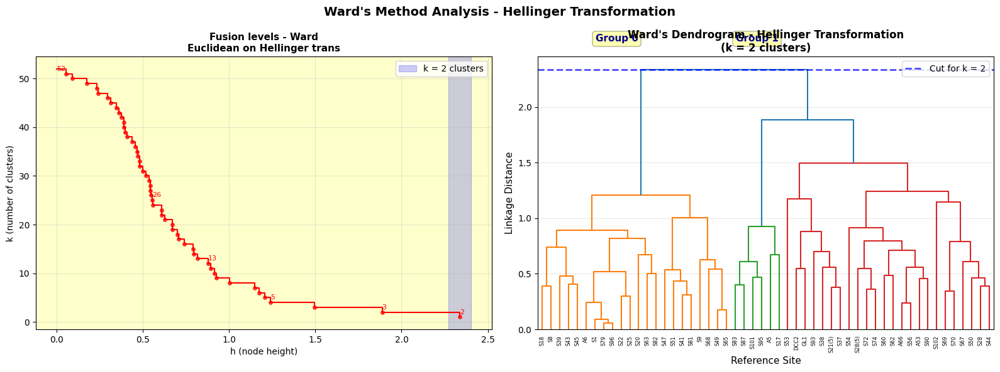

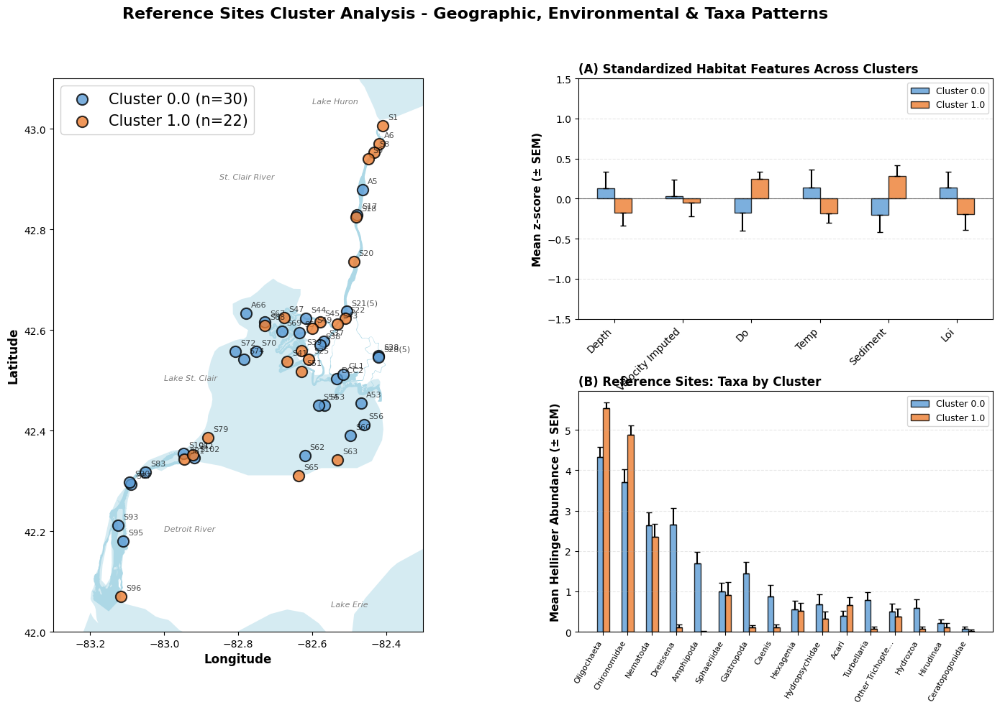

In [6]:
# =============================================================================
# STAGE 2: TAXA ASSEMBLAGE ON REFERENCE SITES
# =============================================================================

print("\n" + "=" * 80)
print("STAGE 2: TAXA ASSEMBLAGE ON REFERENCE SITES")
print("=" * 80)

# Reload module
modules_to_remove = [key for key in sys.modules.keys() if 'zci.taxa_assemblage_in_refs' in key]
for mod in modules_to_remove:
    del sys.modules[mod]

from zci.taxa_assemblage_in_refs import reference_sites_taxa_assemblage_pipeline

# Get parameters
cfg_s2 = KEY_PARAMS['stage2']
other_s2 = OTHER_PARAMS['stage2']

# Save paths
save_path = FIGURE_PATHS[2] if OUTPUT_PARAMS['save_figures'] else None
table_save_path = TABLE_PATHS[2] if OUTPUT_PARAMS['save_tables'] else None

# Run pipeline with KEY_PARAMS explicitly
stage2_results = reference_sites_taxa_assemblage_pipeline(
    raw_data=raw_data_s1,
    multiindex_data=multiindex_data_s1,
    pollution_column=DATA_PARAMS['pollution_column'],
    # --- KEY PARAMS (explicitly set) ---
    **cfg_s2,
    # --- OTHER PARAMS ---
    **other_s2,
    # --- OUTPUT ---
    save_path=save_path,
    save_tables=OUTPUT_PARAMS['save_tables'],
    table_save_path=table_save_path,
    verbose=KEY_PARAMS['verbose'],
)

# Extract outputs
raw_data_s2 = stage2_results['raw_data']
multiindex_data_s2 = stage2_results['multiindex_data']

print(f"\n✓ Stage 2 Complete!")
print(f"  - Reference sites: {(raw_data_s2['if_ref'] == True).sum()}")
print(f"  - Cluster distribution: {stage2_results['cluster_distribution']}")
if 'figures' in stage2_results and OUTPUT_PARAMS['save_figures']:
    print(f"  - Figures saved: {len(stage2_results['figures'])} to {save_path}")

---

## Stage 3: Environment-Driven Taxa Clusters (RDA + LDA)

**Key Parameters**:
- `taxa_transformation`: Transformation for RDA
- `lda_log_transform_env`: Whether to log-transform env vars for LDA


STAGE 3: ENVIRONMENT-DRIVEN TAXA CLUSTERS (RDA + LDA)

ENVIRONMENT-DRIVEN TAXA CLUSTERS ANALYSIS PIPELINE

This pipeline performs:
  1. RDA ordination analysis
  2. LDA classification with Monte Carlo CV
  3. LDA-RDA axis comparison
  4. Non-reference site prediction
  5. Data integration with complete cluster labels


STEP 1: REDUNDANCY ANALYSIS (RDA)

REDUNDANCY ANALYSIS (RDA) PIPELINE

Analyzing habitat-taxa relationships at reference sites

Step 1: Filtering reference sites...
  - Total sites: 52
  - Reference sites: 52
  - Clusters: 2

Step 2: Preparing environmental data...
  - Standardizing environmental variables (z-score)
  - Environmental variables: 6
  - Shape: (52, 6)

Step 3: Preparing taxa data...
  - Taxa transformation: Hellinger
  - Number of taxa: 16
  - Shape: (52, 16)

Step 4: Fitting RDA model...
  ✓ RDA model fitted successfully
  - R²: 0.2085
  - Adjusted R²: 0.1030
  - Constrained inertia: 3.3098
  - Residual inertia: 12.5638

Step 5: Performing permutation tes

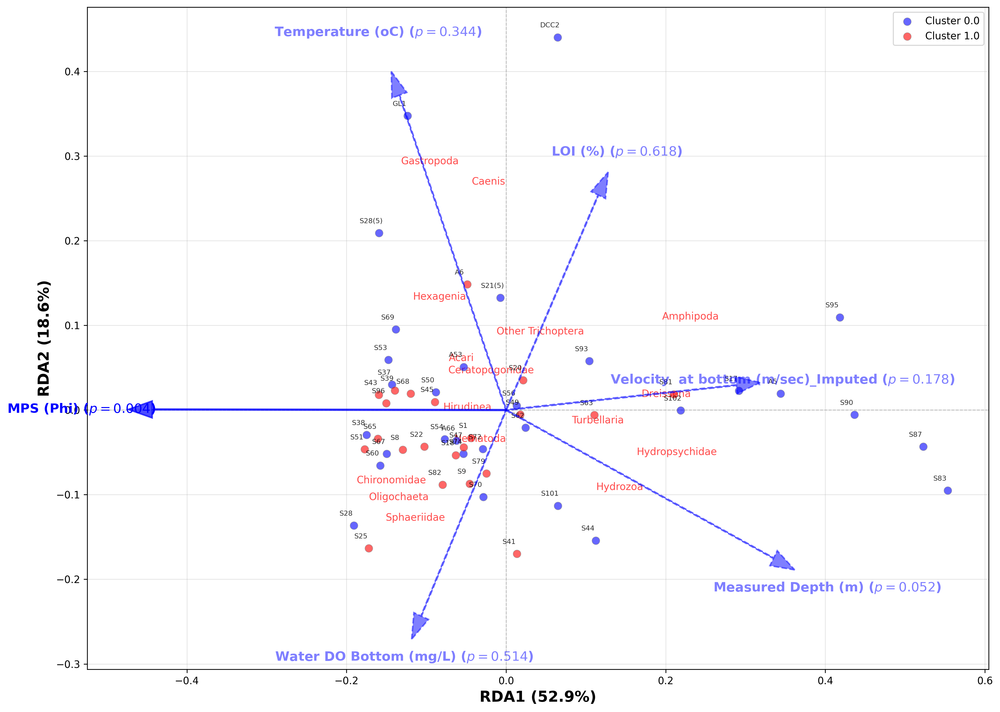

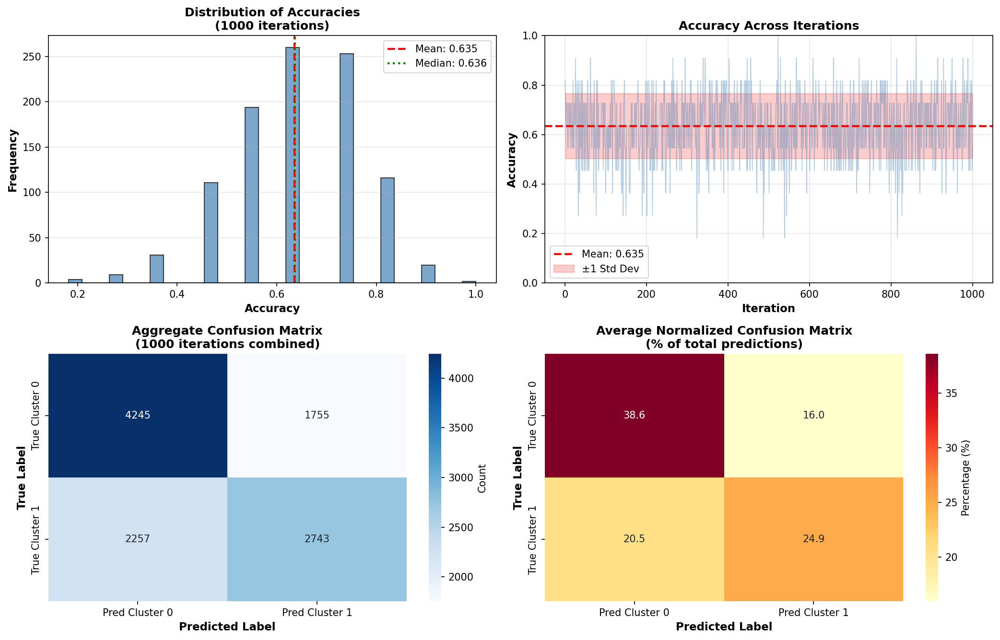

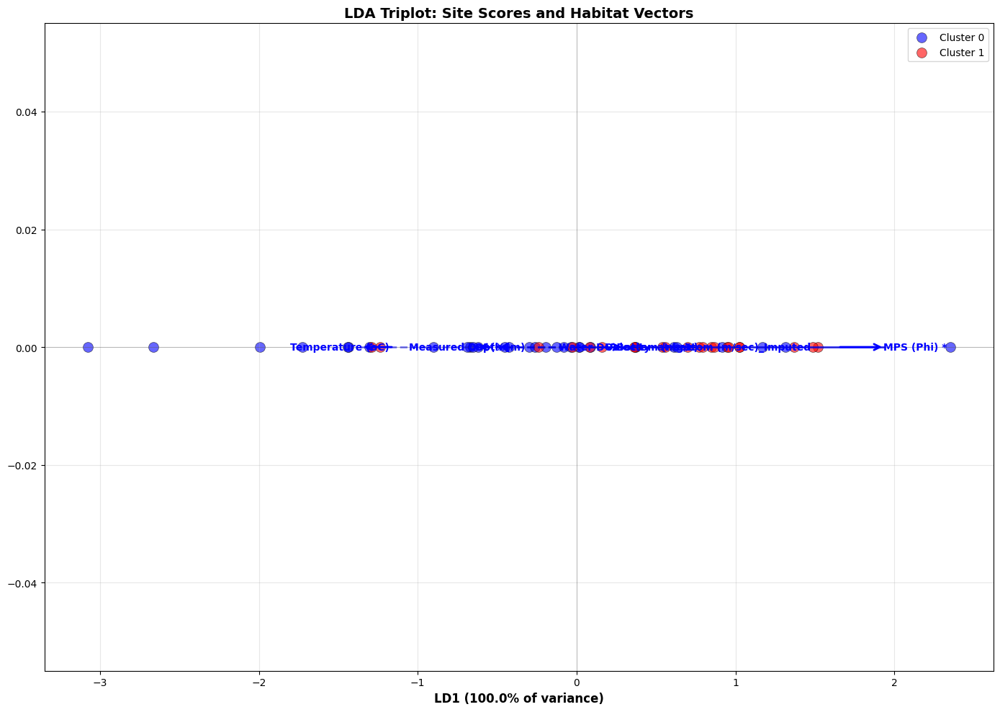

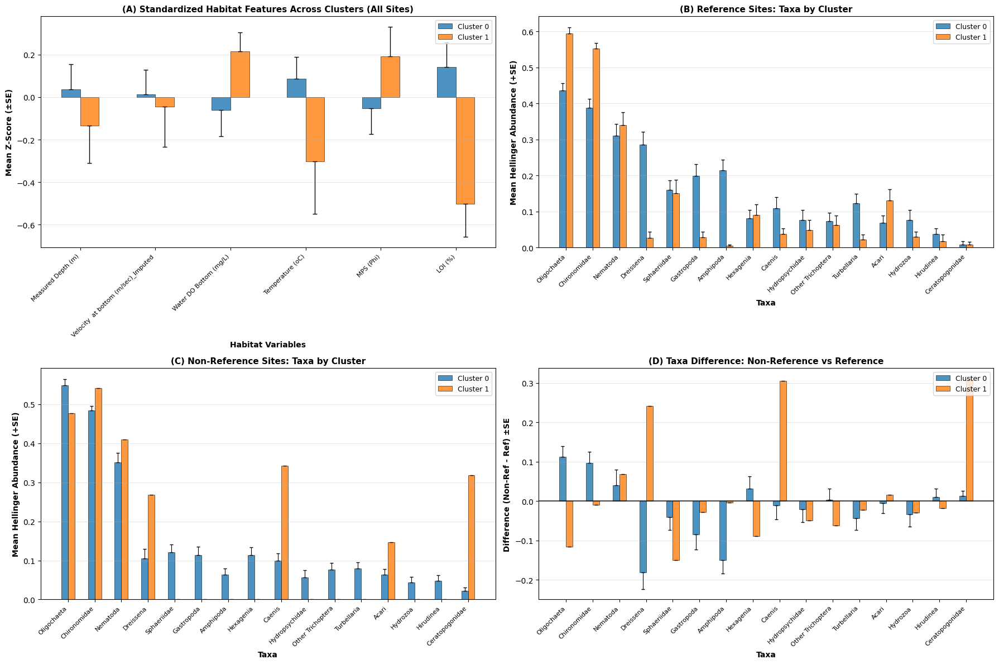

In [7]:
# =============================================================================
# STAGE 3: ENVIRONMENT-DRIVEN TAXA CLUSTERS (RDA + LDA)
# =============================================================================

print("\n" + "=" * 80)
print("STAGE 3: ENVIRONMENT-DRIVEN TAXA CLUSTERS (RDA + LDA)")
print("=" * 80)

# Reload module
modules_to_remove = [key for key in sys.modules.keys() if 'zci.env_driven_taxa_clusters' in key]
for mod in modules_to_remove:
    del sys.modules[mod]

from zci.env_driven_taxa_clusters import perform_env_taxa_analysis

# Get parameters
cfg_s3 = KEY_PARAMS['stage3']
# cfg_s2 = KEY_PARAMS['stage2']  # env_variables from stage 2
other_s3 = OTHER_PARAMS['stage3']

# Save paths
save_path = FIGURE_PATHS[3] if OUTPUT_PARAMS['save_figures'] else None
table_save_path = TABLE_PATHS[3] if OUTPUT_PARAMS['save_tables'] else None

# Run pipeline with KEY_PARAMS explicitly
stage3_results = perform_env_taxa_analysis(
    raw_data=raw_data_s2,
    multiindex_data=multiindex_data_s2,
    env_variables=cfg_s2['env_variables'],  # Use env_variables from Stage 2
    cluster_column=DATA_PARAMS['cluster_column'],
    ref_column=DATA_PARAMS['ref_column'],
    # --- KEY PARAMS (explicitly set) ---
    **cfg_s3,
    # --- OTHER PARAMS ---
    **other_s3,
    # --- OUTPUT ---
    random_state=KEY_PARAMS['random_state'],
    save_path=save_path,
    save_tables=OUTPUT_PARAMS['save_tables'],
    table_save_path=table_save_path,
    verbose=KEY_PARAMS['verbose'],
)

# Extract outputs
raw_data_s3 = stage3_results['updated_raw_data']
multiindex_data_s3 = stage3_results['updated_multiindex_data']

print(f"\n✓ Stage 3 Complete!")
print(f"  - RDA R²: {stage3_results['rda_results']['rda_model'].fit_.r2:.3f}")
print(f"  - RDA Global Test p-value: {stage3_results['rda_results']['global_test'].p_value:.4f}")
print(f"  - LDA Full Model Accuracy: {stage3_results['lda_results']['accuracy']:.2%}")
print(f"  - LDA CV Mean Accuracy: {stage3_results['lda_cv_results']['mean_accuracy']:.2%} ± {stage3_results['lda_cv_results']['std_accuracy']:.2%}")
if 'figures' in stage3_results and OUTPUT_PARAMS['save_figures']:
    print(f"  - Figures saved: {len(stage3_results['figures'])} to {save_path}")

---

## Stage 4: Community Composition Ordination (PCA-based ZCI)

**Key Parameters**:
- `taxa_transformation`: Transformation for species PCA
- `decomposing_percentile`: Training percentile (100 = all sites)
- `least_pollution_percentile`: Reference percentile for ZCI centroid
- `zci_pc_planes`: PCs to use for ZCI in each cluster
- `normalize_pcs`: Whether to normalize species PCs
- `pc_plane`: PC axes for ordination visualization
- `custom_ref_sites`: Custom reference sites for centroid (or auto)


STAGE 4: COMMUNITY COMPOSITION ORDINATION (PCA-based ZCI)
✓ Auto-generated custom_reference_sites (least 15% pollution per cluster)
    Cluster 0.0: 13 reference sites
    Cluster 1.0: 4 reference sites
COMMUNITY COMPOSITION ANALYSIS PIPELINE

Configuration:
  Taxa transformation: hellinger
  Training percentile: 100.0%
  Variance threshold: 70%
  ZCI method: least_pollution_threshold

BLOCK 1: PCA ANALYSIS
Taxa transformation: hellinger
Training percentile: 100.0%
Variance threshold: 70%

--- Extracting taxa data ---
Taxa data shape: (104, 16)

--- Selecting training sites ---
Using all sites for PCA training (percentile=100)

--- Fitting PCA models ---
FITTING PCA MODELS FOR EACH CLUSTER
Taxa transformation: hellinger
Variance threshold: 70%
Number of clusters: 2

--- Cluster 0 ---
  Training sites: 81
  Number of species: 16
  Number of PCs: 7
  Variance explained:
    PC1: 23.61%
    PC2: 13.65%
    PC3: 10.53%
  Total variance: 75.34%

--- Cluster 1 ---
  Training sites: 23
  Num

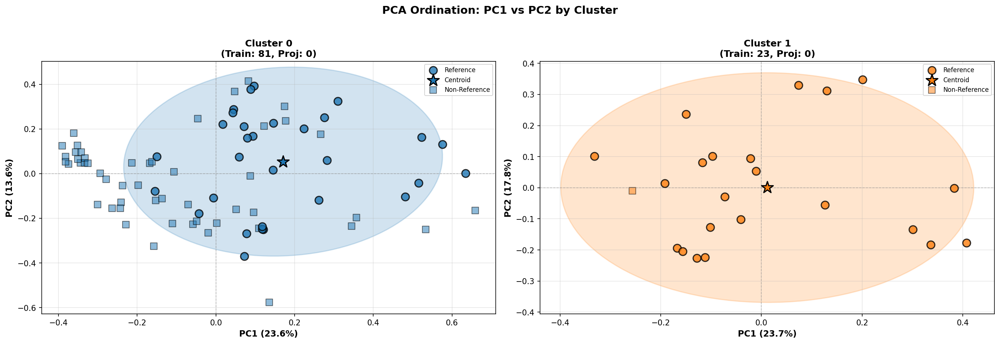

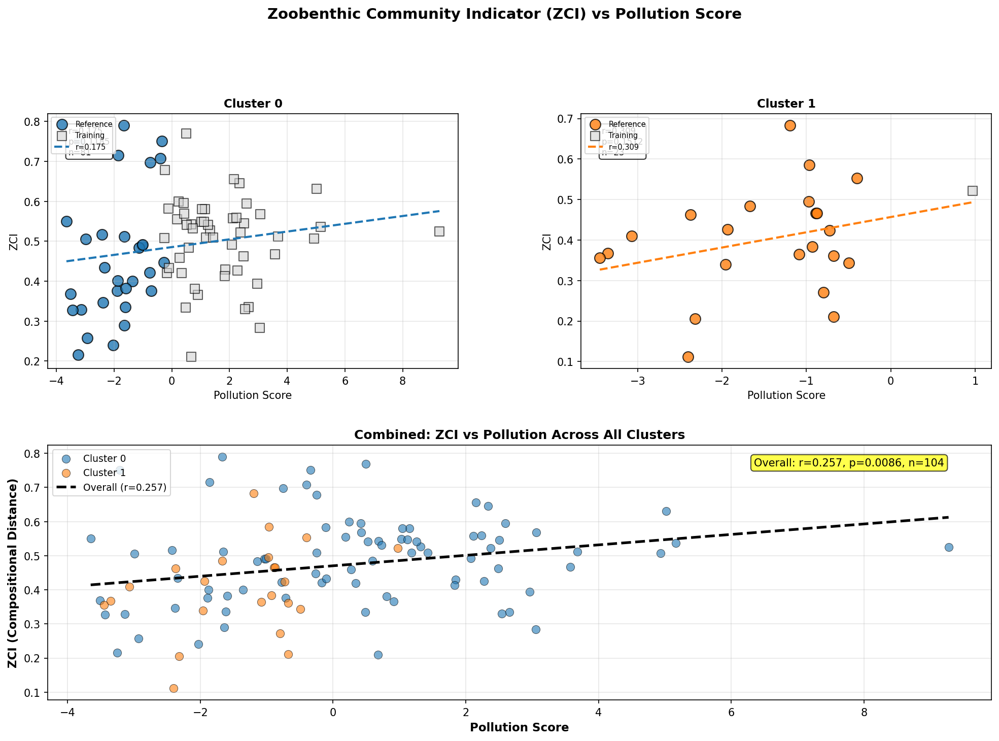

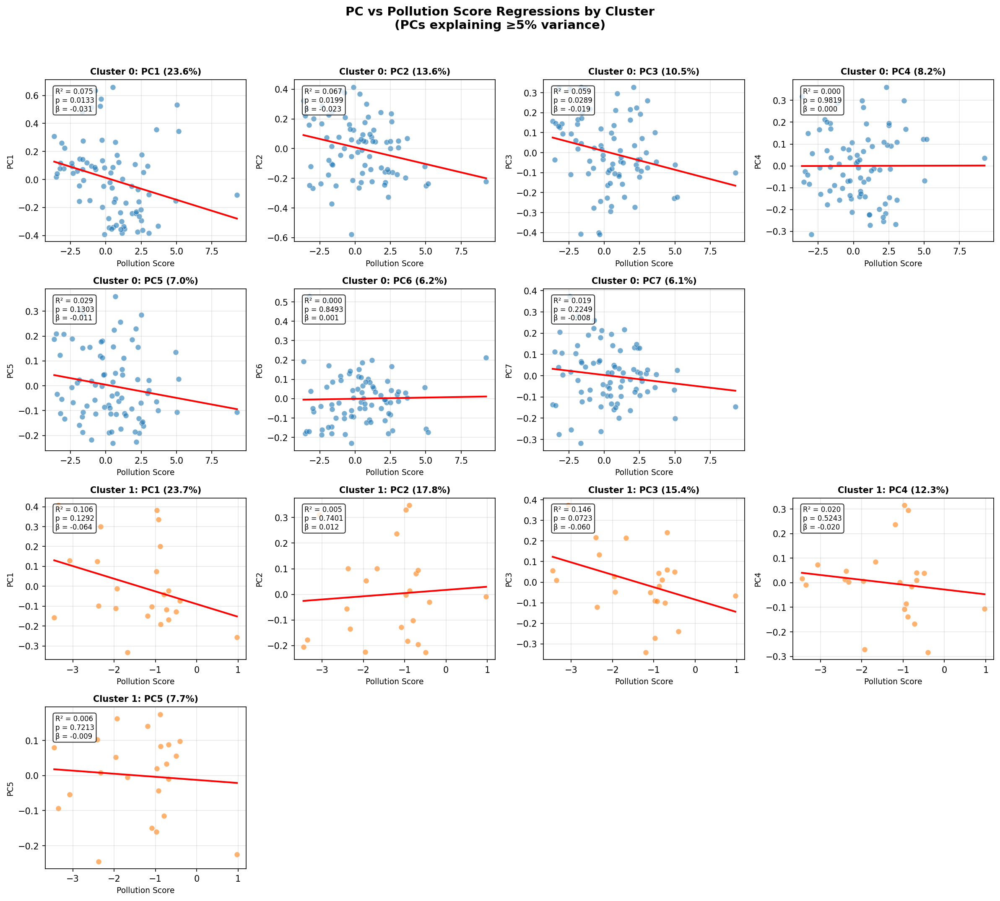

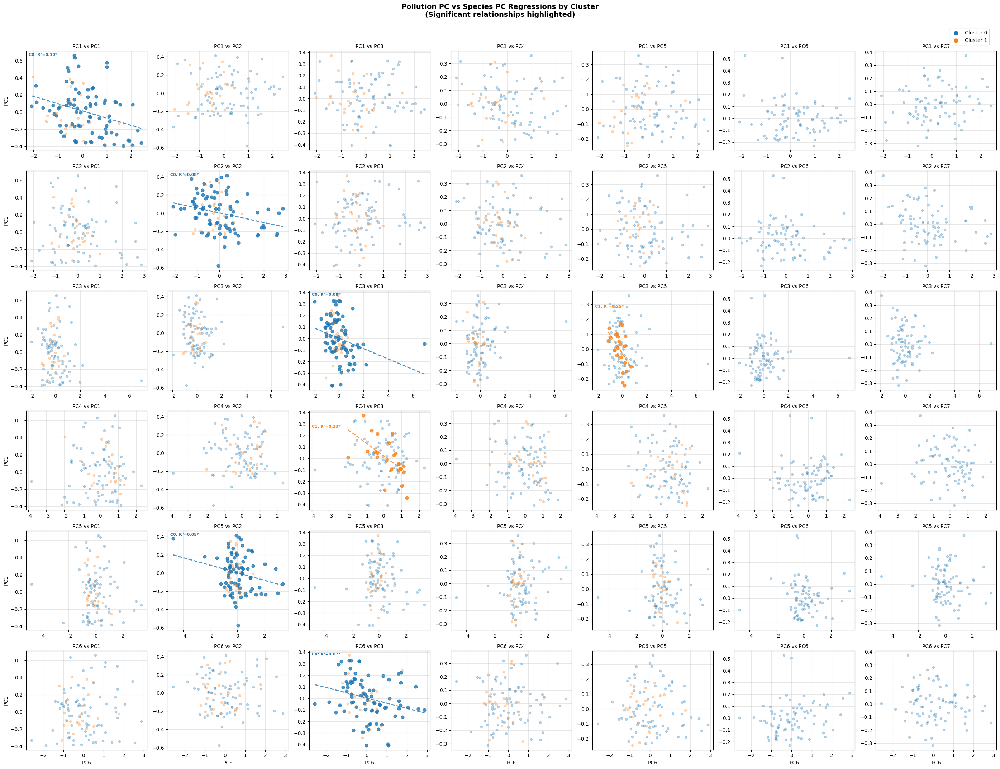

In [8]:
# =============================================================================
# STAGE 4: COMMUNITY COMPOSITION ORDINATION (PCA-based ZCI)
# =============================================================================

print("\n" + "=" * 80)
print("STAGE 4: COMMUNITY COMPOSITION ORDINATION (PCA-based ZCI)")
print("=" * 80)

# Reload module
modules_to_remove = [key for key in sys.modules.keys() if 'zci' in key]
for mod in modules_to_remove:
    del sys.modules[mod]

from zci.community_composition_measures import community_composition_pipeline

# Get parameters
cfg_s4 = KEY_PARAMS['stage4']
other_s4 = OTHER_PARAMS['stage4']

# Save paths
save_path = FIGURE_PATHS[4] if OUTPUT_PARAMS['save_figures'] else None
table_save_path = TABLE_PATHS[4] if OUTPUT_PARAMS['save_tables'] else None

# -----------------------------------------------------------------------------
# Build custom reference sites if not explicitly set
# -----------------------------------------------------------------------------
if cfg_s4['custom_reference_sites'] is None:
    # Auto-generate: sites with lowest pollution in each cluster
    custom_ref_sites = {}
    least_pct = cfg_s4['least_pollution_threshold']
    for cluster_id in raw_data_s3['clusters'].unique():
        cluster_data = raw_data_s3[raw_data_s3['clusters'] == cluster_id]
        threshold = cluster_data['Pollution_Score'].quantile(least_pct / 100)
        ref_sites = cluster_data[cluster_data['Pollution_Score'] <= threshold].index.tolist()
        custom_ref_sites[cluster_id] = ref_sites
    print(f"✓ Auto-generated custom_reference_sites (least {least_pct}% pollution per cluster)")
    for cid, sites in custom_ref_sites.items():
        print(f"    Cluster {cid}: {len(sites)} reference sites")

# Run pipeline with KEY_PARAMS explicitly
stage4_results = community_composition_pipeline(
    raw_data=raw_data_s3,
    multiindex_data=multiindex_data_s3,
    cluster_column=DATA_PARAMS['cluster_column'],
    ref_column=DATA_PARAMS['ref_column'],
    pollution_column=DATA_PARAMS['pollution_column'],
    # --- KEY PARAMS (explicitly set) ---
    **cfg_s4,
    # --- OTHER PARAMS ---
    **other_s4,
    # --- OUTPUT ---
    save_path=save_path,
    save_tables=True,
    table_save_path=table_save_path,
    random_state=KEY_PARAMS['random_state'],
    verbose=KEY_PARAMS['verbose'],
)

# Extract updated data
raw_data_s4 = stage4_results['updated_raw_data']
multiindex_data_s4 = stage4_results['updated_multiindex_data']

print(f"\n✓ Stage 4 Complete!")
print(f"  - ZCI range: [{raw_data_s4['ZCI'].min():.3f}, {raw_data_s4['ZCI'].max():.3f}]")
print(f"  - Figures generated: {len([f for f in stage4_results['figures'].values() if f is not None])}")
if save_path:
    print(f"  - Figures saved to: {save_path}")

## Save all Parameters

In [9]:
# =============================================================================
# SAVE PARAMETERS & FINAL DATA
# =============================================================================

import json
import os

# Save parameter configuration
if OUTPUT_PARAMS['save_parameters']:
    param_save_path = f"{RESULTS_DIR}/parameters"
    os.makedirs(param_save_path, exist_ok=True)
    
    # Convert non-serializable items for JSON
    def make_serializable(obj):
        if isinstance(obj, dict):
            return {str(k): make_serializable(v) for k, v in obj.items()}
        elif isinstance(obj, (list, tuple)):
            return [make_serializable(i) for i in obj]
        elif isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return obj
    
    params_to_save = {
        'timestamp': RUN_TIMESTAMP,
        'KEY_PARAMS': make_serializable(KEY_PARAMS),
        'OTHER_PARAMS': make_serializable(OTHER_PARAMS),
        'DATA_PARAMS': make_serializable(DATA_PARAMS),
        'OUTPUT_PARAMS': make_serializable(OUTPUT_PARAMS),
    }
    
    param_file = f"{param_save_path}/run_{RUN_TIMESTAMP}_params.json"
    with open(param_file, 'w') as f:
        json.dump(params_to_save, f, indent=2)
    print(f"✓ Parameters saved to: {param_file}")

# Print pipeline summary
print("\n" + "=" * 80)
print("PIPELINE COMPLETED SUCCESSFULLY!")
print("=" * 80)

print(f"\n📁 OUTPUT LOCATIONS:")
print(f"  - Figures: {RESULTS_DIR}/figures/")
print(f"  - Tables: {RESULTS_DIR}/tables/")
print(f"  - Parameters: {RESULTS_DIR}/parameters/")

✓ Parameters saved to: ../results/parameters/run_01_22_01_11_params.json

PIPELINE COMPLETED SUCCESSFULLY!

📁 OUTPUT LOCATIONS:
  - Figures: ../results/figures/
  - Tables: ../results/tables/
  - Parameters: ../results/parameters/


# Piecewise Quantile Regression (PQRM)

To any ecologically meaningful pairwise signals of **species** and **pollution**, it is possible to solve for their coefficients of PQRM.

Basically there are two ways to estimate the **CIs** for coefficients and predictions of a PQRM:

1. Using the **Asymptotic normality** of the parameters, which are supported by **M-estimators** that already has set a known limiting distribution for the model parameters.

2. **Bootstrap**-based method that resample the data or create synthetic response values, then statistics the performance of the models over the **B** time iterations.

## Asymptotic Normality in estimating CIs

First, visualize the scatter plot of the two variables fed into the model

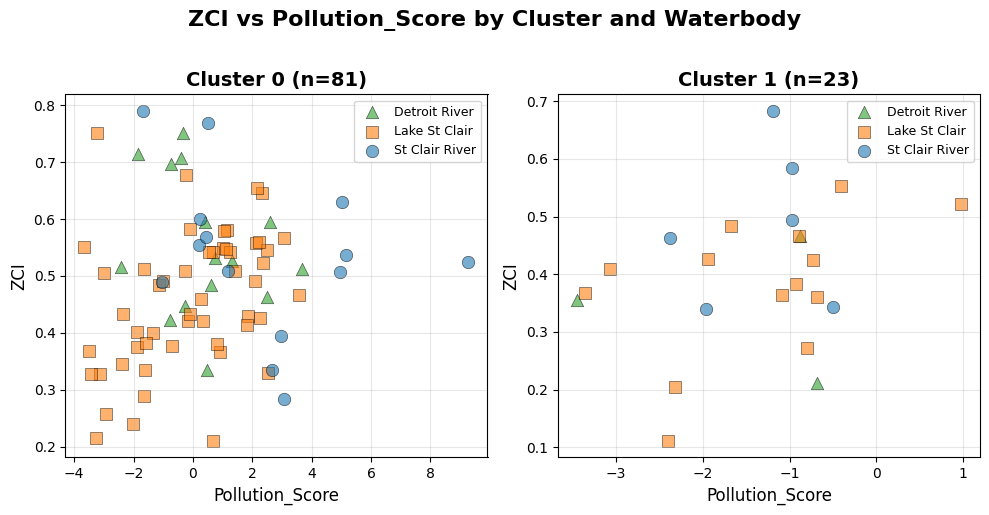

In [10]:
import matplotlib.pyplot as plt

# Get unique clusters
clusters = sorted(raw_data_s4['clusters'].unique())
n_clusters = len(clusters)

# Define waterbody mappings for colors and markers
# SCR = St Clair River, LSC = Lake St Clair, DR = Detroit River
waterbody_colors = {
    'SCR': '#1f77b4',    # blue - St Clair River
    'LSC': '#ff7f0e',    # orange - Lake St Clair
    'DR': '#2ca02c'      # green - Detroit River
}

waterbody_markers = {
    'SCR': 'o',          # circle - St Clair River
    'LSC': 's',          # square - Lake St Clair
    'DR': '^'            # triangle - Detroit River
}

waterbody_labels = {
    'SCR': 'St Clair River',
    'LSC': 'Lake St Clair',
    'DR': 'Detroit River'
}

# Create subplots - one for each cluster
fig, axes = plt.subplots(1, n_clusters, figsize=(5*n_clusters, 5))

# Handle single cluster case (axes won't be array)
if n_clusters == 1:
    axes = [axes]

# Plot each cluster in its own subplot
for idx, (ax, cluster_id) in enumerate(zip(axes, clusters)):
    cluster_data = raw_data_s4[raw_data_s4['clusters'] == cluster_id]
    n_sites = len(cluster_data)
    
    # Plot points grouped by waterbody
    for waterbody in sorted(cluster_data['Waterbody'].unique()):
        wb_data = cluster_data[cluster_data['Waterbody'] == waterbody]
        ax.scatter(
            wb_data['Pollution_Score'], 
            wb_data['ZCI'], 
            alpha=0.6, 
            s=80,
            color=waterbody_colors.get(waterbody, 'gray'),
            marker=waterbody_markers.get(waterbody, 'o'),
            label=waterbody_labels.get(waterbody, waterbody),
            edgecolors='black',
            linewidth=0.5
        )
    
    ax.set_xlabel('Pollution_Score', fontsize=12)
    ax.set_ylabel('ZCI', fontsize=12)
    ax.set_title(f'Cluster {int(cluster_id)} (n={n_sites})', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=9, loc='best')

plt.suptitle('ZCI vs Pollution_Score by Cluster and Waterbody', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

Next, fit OLS and quantile regression in each cluster, estimate their CIs with the asymptotic normality of the parameters.

In [11]:
import statsmodels.api as sm
import numpy as np

# Define 20 quantile levels evenly distributed from 0 to 1
quantile_levels = np.arange(0.2, 0.85, 0.05)

print(f"Quantile levels: {quantile_levels}")
print(f"Number of quantiles: {len(quantile_levels)}")

# Dictionary to store regression results for each cluster
regression_results = {}

# Fit OLS and Quantile Regressions for each cluster
for cluster_id in sorted(raw_data_s4['clusters'].unique()):
    cluster_data = raw_data_s4[raw_data_s4['clusters'] == cluster_id].copy()
    
    # Prepare data: X = Pollution_Score, y = ZCI
    X = cluster_data['Pollution_Score'].values
    y = cluster_data['ZCI'].values
    
    # Add constant for regression
    X_with_const = sm.add_constant(X)
    
    # Fit OLS
    ols_model = sm.OLS(y, X_with_const).fit()
    
    # Fit Quantile Regressions at different quantile levels
    qr_models = {}
    for q in quantile_levels:
        qr_model = sm.QuantReg(y, X_with_const).fit(q=q)
        qr_models[q] = qr_model
    
    # Store results
    regression_results[cluster_id] = {
        'data': cluster_data,
        'X': X,
        'y': y,
        'X_with_const': X_with_const,
        'ols_model': ols_model,
        'qr_models': qr_models,
    }
    
    print(f"\n{'='*60}")
    print(f"Cluster {int(cluster_id)}")
    print(f"{'='*60}")
    print(f"\nOLS Results:")
    print(f"  Intercept: {ols_model.params[0]:.4f}")
    print(f"  Slope: {ols_model.params[1]:.4f}")
    print(f"  R-squared: {ols_model.rsquared:.4f}")

print("\n✓ OLS and Quantile Regressions fitted for all clusters!")

Quantile levels: [0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8 ]
Number of quantiles: 13

Cluster 0

OLS Results:
  Intercept: 0.4853
  Slope: 0.0097
  R-squared: 0.0306

Cluster 1

OLS Results:
  Intercept: 0.4568
  Slope: 0.0376
  R-squared: 0.0956

✓ OLS and Quantile Regressions fitted for all clusters!


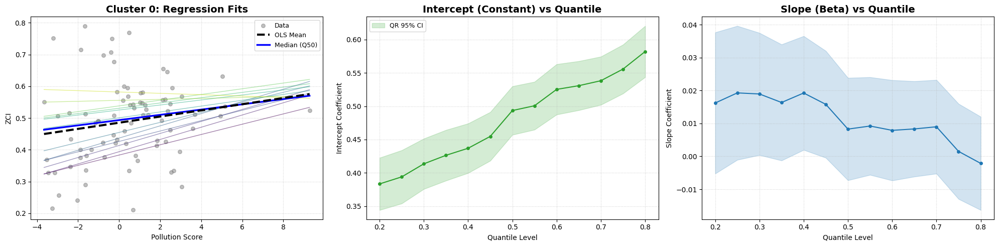

Cluster 0 Stability Summary:
  OLS Slope: 0.0097 (95% CI: -0.0025, 0.0220)
  QR Slope Range: -0.0021 to 0.0193
----------------------------------------------------------------------------------------------------


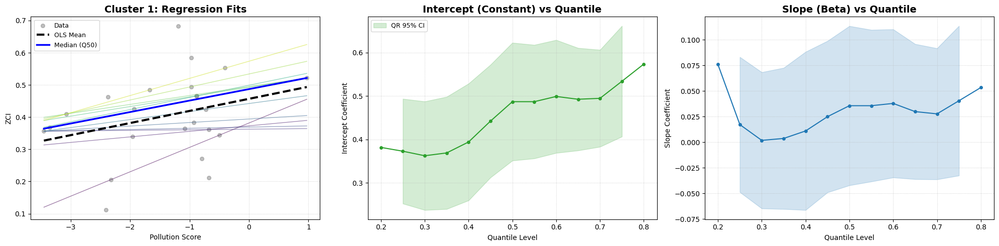

Cluster 1 Stability Summary:
  OLS Slope: 0.0376 (95% CI: -0.0149, 0.0902)
  QR Slope Range: 0.0018 to 0.0759
----------------------------------------------------------------------------------------------------


In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Iterate through clusters to generate plots
for cluster_id in sorted(regression_results.keys()):
    res = regression_results[cluster_id]
    
    # Extract calculated models
    X = res['X']
    X_prime = res['X_with_const']
    y = res['y']
    ols = res['ols_model']
    qr_models = res['qr_models']
    
    # Get sorted list of quantiles computed in previous cell
    sorted_quantiles = sorted(qr_models.keys())
    
    # 1. Prepare grid for plotting regression lines
    # -------------------------------------------------------
    x_grid = np.linspace(X.min(), X.max(), 100)
    x_grid_prime = sm.add_constant(x_grid)
    
    # 2. Extract Coefficients and CIs for Parameter Plots
    # -------------------------------------------------------
    params = {
        'intercept': [], 'intercept_ci_low': [], 'intercept_ci_high': [],
        'slope': [], 'slope_ci_low': [], 'slope_ci_high': []
    }
    
    for q in sorted_quantiles:
        model = qr_models[q]
        conf = model.conf_int(alpha=0.05) # 95% CI
        
        # Intercept (index 0)
        params['intercept'].append(model.params[0])
        params['intercept_ci_low'].append(conf[0][0])
        params['intercept_ci_high'].append(conf[0][1])
        
        # Slope (index 1)
        params['slope'].append(model.params[1])
        params['slope_ci_low'].append(conf[1][0])
        params['slope_ci_high'].append(conf[1][1])

    # 3. Create Visualization (3 Panels)
    # -------------------------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(20, 5))
    
    # --- Panel 1: Regression Fits (Data Space) ---
    ax = axes[0]
    # Scatter data
    ax.scatter(X, y, alpha=0.5, color='gray', s=30, label='Data', zorder=1)
    
    # Plot OLS Line
    ols_pred = ols.get_prediction(x_grid_prime).summary_frame(alpha=0.05)
    ax.plot(x_grid, ols_pred['mean'], color='black', linewidth=3, linestyle='--', label='OLS Mean', zorder=10)
    
    # Plot All Quantile Lines using a Colormap
    cmap = plt.cm.viridis
    n_q = len(sorted_quantiles)
    
    for i, q in enumerate(sorted_quantiles):
        y_q = qr_models[q].predict(x_grid_prime)
        
        # Style logic: Highlight median, fade others
        if np.isclose(q, 0.5):
            color = 'blue'
            lw = 2.5
            alpha = 1.0
            label = 'Median (Q50)'
            zorder = 9
        else:
            color = cmap(i / n_q)
            lw = 1
            alpha = 0.5
            label = None
            zorder = 5
            
        ax.plot(x_grid, y_q, color=color, linewidth=lw, alpha=alpha, label=label, zorder=zorder)
        
    ax.set_title(f'Cluster {int(cluster_id)}: Regression Fits', fontsize=14, fontweight='bold')
    ax.set_xlabel('Pollution Score')
    ax.set_ylabel('ZCI')
    # Filter duplicate labels for legend
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='best', fontsize=9)
    ax.grid(True, linestyle=':', alpha=0.6)

    # --- Panel 2: Intercept Parameter Plane ---
    ax = axes[1]
    # OLS Benchmark
    # ax.axhline(ols.params[0], color='black', linestyle='--', label='OLS Estimate')
    # ols_ci = ols.conf_int()[0]
    # ax.fill_between([0, 1], ols_ci[0], ols_ci[1], color='black', alpha=0.1, transform=ax.get_yaxis_transform(), label='OLS 95% CI')
    
    # Quantile Estimates
    ax.plot(sorted_quantiles, params['intercept'], marker='o', markersize=4, color='#2ca02c')
    ax.fill_between(sorted_quantiles, params['intercept_ci_low'], params['intercept_ci_high'], color='#2ca02c', alpha=0.2, label='QR 95% CI')
    
    ax.set_title('Intercept (Constant) vs Quantile', fontsize=14, fontweight='bold')
    ax.set_xlabel('Quantile Level')
    ax.set_ylabel('Intercept Coefficient')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='best', fontsize=9)

    # --- Panel 3: Slope Parameter Plane ---
    ax = axes[2]
    # OLS Benchmark
    # ax.axhline(ols.params[1], color='black', linestyle='--', label='OLS Estimate')
    # ols_ci = ols.conf_int()[1]
    # ax.fill_between([0, 1], ols_ci[0], ols_ci[1], color='black', alpha=0.1, transform=ax.get_yaxis_transform(), label='OLS 95% CI')
    
    # Quantile Estimates
    ax.plot(sorted_quantiles, params['slope'], marker='o', markersize=4, color='#1f77b4')
    ax.fill_between(sorted_quantiles, params['slope_ci_low'], params['slope_ci_high'], color='#1f77b4', alpha=0.2, label='QR 95% CI')
    
    ax.set_title('Slope (Beta) vs Quantile', fontsize=14, fontweight='bold')
    ax.set_xlabel('Quantile Level')
    ax.set_ylabel('Slope Coefficient')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    plt.tight_layout()
    plt.show()

    # Print numerical bounds
    print(f"Cluster {int(cluster_id)} Stability Summary:")
    print(f"  OLS Slope: {ols.params[1]:.4f} (95% CI: {ols.conf_int()[1][0]:.4f}, {ols.conf_int()[1][1]:.4f})")
    print(f"  QR Slope Range: {min(params['slope']):.4f} to {max(params['slope']):.4f}")
    print("-" * 100)

## Bootstrap CIs with resampling the data

In [13]:
import numpy as np
import statsmodels.api as sm
from tqdm import tqdm

# ============================================================================
# BOOTSTRAP CONFIDENCE INTERVALS FOR QUANTILE REGRESSION
# ============================================================================

# Bootstrap parameters
N_BOOTSTRAP = 1000  # Number of bootstrap iterations
ALPHA = 0.05        # Significance level for 95% CI
np.random.seed(42)  # For reproducibility

print(f"Bootstrap Configuration:")
print(f"  Number of iterations: {N_BOOTSTRAP}")
print(f"  Confidence Level: {(1 - ALPHA) * 100:.0f}%")
print(f"  Quantile levels: {quantile_levels}")

# Dictionary to store bootstrap results for all clusters
bootstrap_results = {}

# Perform bootstrap for each cluster
for cluster_id in sorted(regression_results.keys()):
    print(f"\n{'='*60}")
    print(f"Cluster {int(cluster_id)}: Running Bootstrap...")
    print(f"{'='*60}")
    
    res = regression_results[cluster_id]
    X = res['X']
    y = res['y']
    n = len(y)
    
    # Arrays to store bootstrap coefficients
    # Shape: (n_bootstrap, n_quantiles, 2) - [intercept, slope]
    boot_coeffs = {q: {'intercept': [], 'slope': []} for q in quantile_levels}
    boot_ols_coeffs = {'intercept': [], 'slope': []}
    
    # Bootstrap loop
    for b in tqdm(range(N_BOOTSTRAP), desc=f"Cluster {int(cluster_id)}"):
        # Resample indices with replacement
        boot_indices = np.random.choice(n, size=n, replace=True)
        X_boot = X[boot_indices]
        y_boot = y[boot_indices]
        
        # Add constant for regression
        X_boot_const = sm.add_constant(X_boot)
        
        # Fit OLS on bootstrap sample
        try:
            ols_boot = sm.OLS(y_boot, X_boot_const).fit()
            boot_ols_coeffs['intercept'].append(ols_boot.params[0])
            boot_ols_coeffs['slope'].append(ols_boot.params[1])
        except:
            boot_ols_coeffs['intercept'].append(np.nan)
            boot_ols_coeffs['slope'].append(np.nan)
        
        # Fit Quantile Regression at each quantile level
        for q in quantile_levels:
            try:
                qr_boot = sm.QuantReg(y_boot, X_boot_const).fit(q=q, max_iter=1000)
                boot_coeffs[q]['intercept'].append(qr_boot.params[0])
                boot_coeffs[q]['slope'].append(qr_boot.params[1])
            except:
                boot_coeffs[q]['intercept'].append(np.nan)
                boot_coeffs[q]['slope'].append(np.nan)
    
    # Calculate bootstrap CIs using percentile method
    ci_lower = ALPHA / 2
    ci_upper = 1 - ALPHA / 2
    
    bootstrap_summary = {
        'quantiles': [],
        'intercept_mean': [],
        'intercept_std': [],
        'intercept_ci_low': [],
        'intercept_ci_high': [],
        'slope_mean': [],
        'slope_std': [],
        'slope_ci_low': [],
        'slope_ci_high': [],
    }
    
    for q in quantile_levels:
        intercepts = np.array(boot_coeffs[q]['intercept'])
        slopes = np.array(boot_coeffs[q]['slope'])
        
        # Remove NaNs
        intercepts = intercepts[~np.isnan(intercepts)]
        slopes = slopes[~np.isnan(slopes)]
        
        bootstrap_summary['quantiles'].append(q)
        bootstrap_summary['intercept_mean'].append(np.mean(intercepts))
        bootstrap_summary['intercept_std'].append(np.std(intercepts))
        bootstrap_summary['intercept_ci_low'].append(np.percentile(intercepts, ci_lower * 100))
        bootstrap_summary['intercept_ci_high'].append(np.percentile(intercepts, ci_upper * 100))
        bootstrap_summary['slope_mean'].append(np.mean(slopes))
        bootstrap_summary['slope_std'].append(np.std(slopes))
        bootstrap_summary['slope_ci_low'].append(np.percentile(slopes, ci_lower * 100))
        bootstrap_summary['slope_ci_high'].append(np.percentile(slopes, ci_upper * 100))
    
    # OLS bootstrap summary
    ols_intercepts = np.array(boot_ols_coeffs['intercept'])
    ols_slopes = np.array(boot_ols_coeffs['slope'])
    ols_intercepts = ols_intercepts[~np.isnan(ols_intercepts)]
    ols_slopes = ols_slopes[~np.isnan(ols_slopes)]
    
    ols_summary = {
        'intercept_mean': np.mean(ols_intercepts),
        'intercept_std': np.std(ols_intercepts),
        'intercept_ci': (np.percentile(ols_intercepts, ci_lower * 100), 
                         np.percentile(ols_intercepts, ci_upper * 100)),
        'slope_mean': np.mean(ols_slopes),
        'slope_std': np.std(ols_slopes),
        'slope_ci': (np.percentile(ols_slopes, ci_lower * 100), 
                     np.percentile(ols_slopes, ci_upper * 100)),
    }
    
    # Store results
    bootstrap_results[cluster_id] = {
        'boot_coeffs': boot_coeffs,
        'boot_ols_coeffs': boot_ols_coeffs,
        'summary': bootstrap_summary,
        'ols_summary': ols_summary,
    }
    
    print(f"\n  OLS Bootstrap Summary:")
    print(f"    Intercept: {ols_summary['intercept_mean']:.4f} ± {ols_summary['intercept_std']:.4f}")
    print(f"    Intercept 95% CI: [{ols_summary['intercept_ci'][0]:.4f}, {ols_summary['intercept_ci'][1]:.4f}]")
    print(f"    Slope: {ols_summary['slope_mean']:.4f} ± {ols_summary['slope_std']:.4f}")
    print(f"    Slope 95% CI: [{ols_summary['slope_ci'][0]:.4f}, {ols_summary['slope_ci'][1]:.4f}]")

print("\n" + "="*60)
print("✓ Bootstrap completed for all clusters!")
print("="*60)

Bootstrap Configuration:
  Number of iterations: 1000
  Confidence Level: 95%
  Quantile levels: [0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8 ]

Cluster 0: Running Bootstrap...


Cluster 0:   1%|          | 7/1000 [00:00<00:29, 33.68it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 0:   6%|▌         | 62/1000 [00:01<00:28, 33.39it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 0:   7%|▋         | 74/1000 [00:02<00:27, 33.17it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum nu


  OLS Bootstrap Summary:
    Intercept: 0.4863 ± 0.0152
    Intercept 95% CI: [0.4565, 0.5162]
    Slope: 0.0099 ± 0.0063
    Slope 95% CI: [-0.0028, 0.0219]

Cluster 1: Running Bootstrap...


Cluster 1:   0%|          | 3/1000 [00:00<00:34, 28.70it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 1:   2%|▏         | 16/1000 [00:00<00:24, 39.60it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 1:   2%|▏         | 20/1000 [00:00<00:31, 30.88it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum nu


  OLS Bootstrap Summary:
    Intercept: 0.4546 ± 0.0394
    Intercept 95% CI: [0.3745, 0.5280]
    Slope: 0.0377 ± 0.0217
    Slope 95% CI: [-0.0031, 0.0844]

✓ Bootstrap completed for all clusters!


### Visualization: Bootstrap CIs vs Asymptotic CIs Comparison

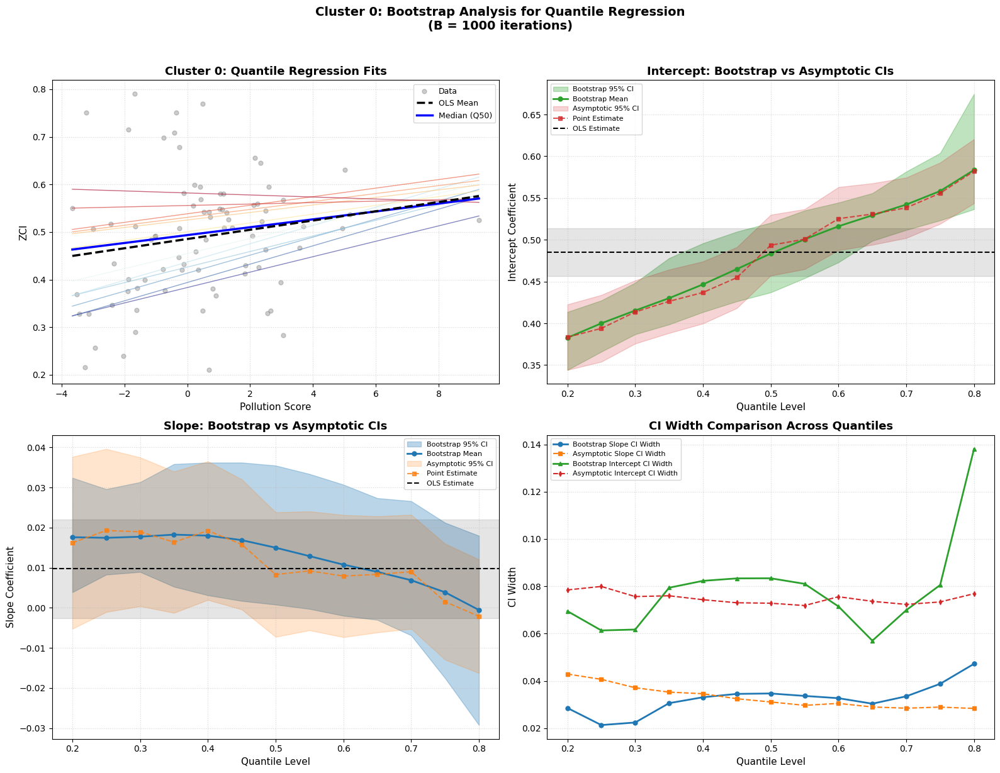


Cluster 0 - Bootstrap vs Asymptotic CI Comparison

Quantile   Slope (Boot)         Slope (Asym)         Width Ratio    
-----------------------------------------------------------------
0.20       [ 0.0039,  0.0324]  [-0.0052,  0.0377]        0.67
0.25       [ 0.0083,  0.0296]  [-0.0011,  0.0396]        0.52
0.30       [ 0.0089,  0.0313]  [ 0.0004,  0.0375]        0.60
0.35       [ 0.0053,  0.0358]  [-0.0013,  0.0340]        0.87
0.40       [ 0.0031,  0.0362]  [ 0.0020,  0.0365]        0.96
0.45       [ 0.0017,  0.0362]  [-0.0004,  0.0320]        1.06
0.50       [ 0.0008,  0.0355]  [-0.0073,  0.0238]        1.12
0.55       [-0.0003,  0.0334]  [-0.0056,  0.0240]        1.13
0.60       [-0.0020,  0.0307]  [-0.0073,  0.0231]        1.07
0.65       [-0.0030,  0.0273]  [-0.0061,  0.0228]        1.05
0.70       [-0.0069,  0.0266]  [-0.0052,  0.0232]        1.18
0.75       [-0.0175,  0.0212]  [-0.0129,  0.0160]        1.34
0.80       [-0.0292,  0.0180]  [-0.0163,  0.0120]        1.67



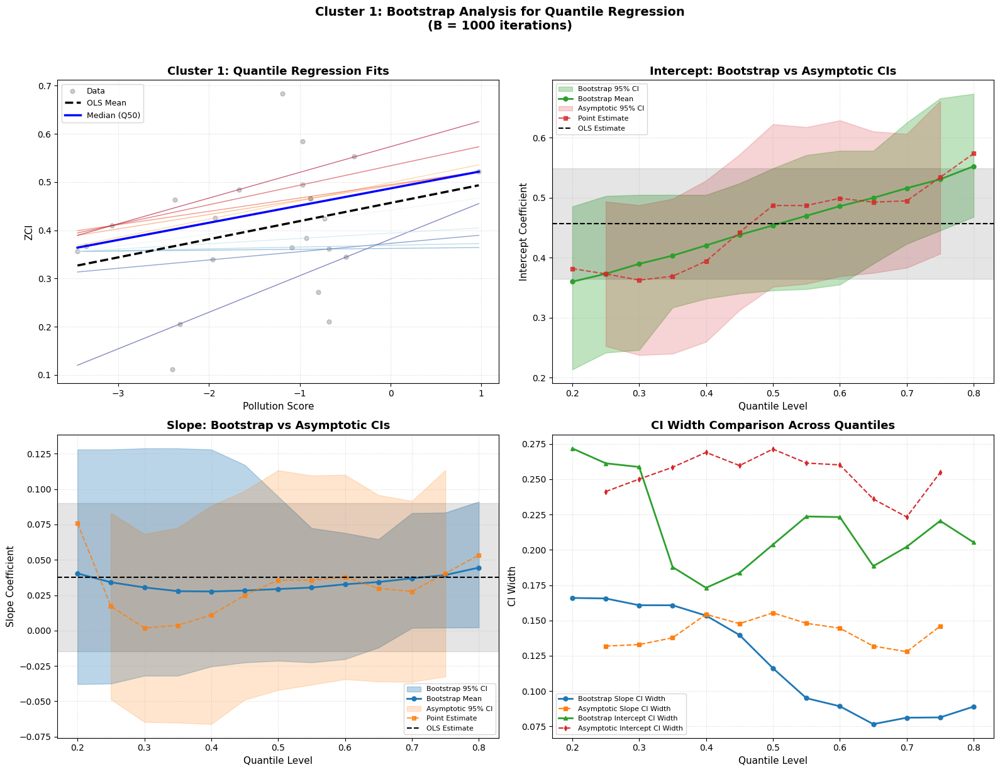


Cluster 1 - Bootstrap vs Asymptotic CI Comparison

Quantile   Slope (Boot)         Slope (Asym)         Width Ratio    
-----------------------------------------------------------------
0.20       [-0.0379,  0.1280]  [    nan,     nan]         nan
0.25       [-0.0375,  0.1280]  [-0.0487,  0.0831]        1.26
0.30       [-0.0320,  0.1288]  [-0.0646,  0.0683]        1.21
0.35       [-0.0319,  0.1288]  [-0.0652,  0.0726]        1.17
0.40       [-0.0254,  0.1280]  [-0.0662,  0.0882]        0.99
0.45       [-0.0225,  0.1171]  [-0.0489,  0.0988]        0.95
0.50       [-0.0214,  0.0948]  [-0.0421,  0.1133]        0.75
0.55       [-0.0225,  0.0724]  [-0.0383,  0.1096]        0.64
0.60       [-0.0202,  0.0690]  [-0.0344,  0.1101]        0.62
0.65       [-0.0120,  0.0646]  [-0.0360,  0.0958]        0.58
0.70       [ 0.0019,  0.0830]  [-0.0363,  0.0916]        0.63
0.75       [ 0.0021,  0.0834]  [-0.0325,  0.1134]        0.56
0.80       [ 0.0022,  0.0912]  [    nan,     nan]         nan



In [14]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# VISUALIZATION: BOOTSTRAP CIs FOR QUANTILE REGRESSION COEFFICIENTS
# ============================================================================

for cluster_id in sorted(bootstrap_results.keys()):
    boot_res = bootstrap_results[cluster_id]
    reg_res = regression_results[cluster_id]
    
    summary = boot_res['summary']
    ols_model = reg_res['ols_model']
    qr_models = reg_res['qr_models']
    X = reg_res['X']
    y = reg_res['y']
    
    # Create figure with 4 panels
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # =========================================================================
    # Panel 1: Regression Fits with Bootstrap CIs
    # =========================================================================
    ax = axes[0, 0]
    
    # Scatter data
    ax.scatter(X, y, alpha=0.4, color='gray', s=25, label='Data', zorder=1)
    
    # Prediction grid
    x_grid = np.linspace(X.min(), X.max(), 100)
    x_grid_const = sm.add_constant(x_grid)
    
    # Plot OLS line with bootstrap CI
    ols_pred = ols_model.predict(x_grid_const)
    ax.plot(x_grid, ols_pred, color='black', linewidth=2.5, linestyle='--', 
            label='OLS Mean', zorder=10)
    
    # Color map for quantiles
    cmap = plt.cm.RdYlBu_r
    sorted_q = np.array(summary['quantiles'])
    n_q = len(sorted_q)
    
    # Plot quantile regression lines
    for i, q in enumerate(sorted_q):
        qr_model = qr_models[q]
        y_pred = qr_model.predict(x_grid_const)
        
        color = cmap(i / (n_q - 1)) if n_q > 1 else cmap(0.5)
        
        if np.isclose(q, 0.5):
            ax.plot(x_grid, y_pred, color='blue', linewidth=2.5, 
                    label=f'Median (Q50)', zorder=9)
        else:
            ax.plot(x_grid, y_pred, color=color, linewidth=1, alpha=0.6, zorder=5)
    
    ax.set_title(f'Cluster {int(cluster_id)}: Quantile Regression Fits', 
                 fontsize=13, fontweight='bold')
    ax.set_xlabel('Pollution Score', fontsize=11)
    ax.set_ylabel('ZCI', fontsize=11)
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # =========================================================================
    # Panel 2: Intercept Coefficients - Bootstrap vs Asymptotic CIs
    # =========================================================================
    ax = axes[0, 1]
    
    # Get asymptotic CIs from original models
    asym_intercept_low = []
    asym_intercept_high = []
    point_estimates = []
    
    for q in sorted_q:
        model = qr_models[q]
        conf = model.conf_int(alpha=ALPHA)
        point_estimates.append(model.params[0])
        asym_intercept_low.append(conf[0][0])
        asym_intercept_high.append(conf[0][1])
    
    # Plot bootstrap CIs
    ax.fill_between(sorted_q, summary['intercept_ci_low'], summary['intercept_ci_high'],
                    color='#2ca02c', alpha=0.3, label='Bootstrap 95% CI')
    ax.plot(sorted_q, summary['intercept_mean'], 'o-', color='#2ca02c', 
            markersize=5, linewidth=2, label='Bootstrap Mean')
    
    # Plot asymptotic CIs
    ax.fill_between(sorted_q, asym_intercept_low, asym_intercept_high,
                    color='#d62728', alpha=0.2, label='Asymptotic 95% CI')
    ax.plot(sorted_q, point_estimates, 's--', color='#d62728', 
            markersize=4, linewidth=1.5, alpha=0.8, label='Point Estimate')
    
    # OLS reference
    ols_int = ols_model.params[0]
    ols_ci = ols_model.conf_int()[0]
    ax.axhline(ols_int, color='black', linestyle='--', linewidth=1.5, label='OLS Estimate')
    ax.axhspan(ols_ci[0], ols_ci[1], color='black', alpha=0.1)
    
    ax.set_title('Intercept: Bootstrap vs Asymptotic CIs', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('Intercept Coefficient', fontsize=11)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # =========================================================================
    # Panel 3: Slope Coefficients - Bootstrap vs Asymptotic CIs
    # =========================================================================
    ax = axes[1, 0]
    
    # Get asymptotic CIs for slope
    asym_slope_low = []
    asym_slope_high = []
    slope_estimates = []
    
    for q in sorted_q:
        model = qr_models[q]
        conf = model.conf_int(alpha=ALPHA)
        slope_estimates.append(model.params[1])
        asym_slope_low.append(conf[1][0])
        asym_slope_high.append(conf[1][1])
    
    # Plot bootstrap CIs
    ax.fill_between(sorted_q, summary['slope_ci_low'], summary['slope_ci_high'],
                    color='#1f77b4', alpha=0.3, label='Bootstrap 95% CI')
    ax.plot(sorted_q, summary['slope_mean'], 'o-', color='#1f77b4', 
            markersize=5, linewidth=2, label='Bootstrap Mean')
    
    # Plot asymptotic CIs
    ax.fill_between(sorted_q, asym_slope_low, asym_slope_high,
                    color='#ff7f0e', alpha=0.2, label='Asymptotic 95% CI')
    ax.plot(sorted_q, slope_estimates, 's--', color='#ff7f0e', 
            markersize=4, linewidth=1.5, alpha=0.8, label='Point Estimate')
    
    # OLS reference
    ols_slope = ols_model.params[1]
    ols_slope_ci = ols_model.conf_int()[1]
    ax.axhline(ols_slope, color='black', linestyle='--', linewidth=1.5, label='OLS Estimate')
    ax.axhspan(ols_slope_ci[0], ols_slope_ci[1], color='black', alpha=0.1)
    
    ax.set_title('Slope: Bootstrap vs Asymptotic CIs', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('Slope Coefficient', fontsize=11)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # =========================================================================
    # Panel 4: CI Width Comparison (Bootstrap vs Asymptotic)
    # =========================================================================
    ax = axes[1, 1]
    
    # Calculate CI widths
    boot_intercept_width = np.array(summary['intercept_ci_high']) - np.array(summary['intercept_ci_low'])
    boot_slope_width = np.array(summary['slope_ci_high']) - np.array(summary['slope_ci_low'])
    asym_intercept_width = np.array(asym_intercept_high) - np.array(asym_intercept_low)
    asym_slope_width = np.array(asym_slope_high) - np.array(asym_slope_low)
    
    # Plot CI widths
    ax.plot(sorted_q, boot_slope_width, 'o-', color='#1f77b4', 
            linewidth=2, markersize=5, label='Bootstrap Slope CI Width')
    ax.plot(sorted_q, asym_slope_width, 's--', color='#ff7f0e', 
            linewidth=1.5, markersize=4, label='Asymptotic Slope CI Width')
    ax.plot(sorted_q, boot_intercept_width, '^-', color='#2ca02c', 
            linewidth=2, markersize=5, label='Bootstrap Intercept CI Width')
    ax.plot(sorted_q, asym_intercept_width, 'd--', color='#d62728', 
            linewidth=1.5, markersize=4, label='Asymptotic Intercept CI Width')
    
    ax.set_title('CI Width Comparison Across Quantiles', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('CI Width', fontsize=11)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    plt.suptitle(f'Cluster {int(cluster_id)}: Bootstrap Analysis for Quantile Regression\n(B = {N_BOOTSTRAP} iterations)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\n{'='*80}")
    print(f"Cluster {int(cluster_id)} - Bootstrap vs Asymptotic CI Comparison")
    print(f"{'='*80}")
    print(f"\n{'Quantile':<10} {'Slope (Boot)':<20} {'Slope (Asym)':<20} {'Width Ratio':<15}")
    print("-" * 65)
    for i, q in enumerate(sorted_q):
        boot_w = boot_slope_width[i]
        asym_w = asym_slope_width[i]
        ratio = boot_w / asym_w if asym_w != 0 else np.nan
        print(f"{q:<10.2f} [{summary['slope_ci_low'][i]:>7.4f}, {summary['slope_ci_high'][i]:>7.4f}]  "
              f"[{asym_slope_low[i]:>7.4f}, {asym_slope_high[i]:>7.4f}]  {ratio:>10.2f}")
    print()

### Bootstrap Distribution Histograms for Key Quantiles

Visualizing bootstrap distributions for quantiles: [np.float64(0.25), np.float64(0.49999999999999994), np.float64(0.7499999999999999)]


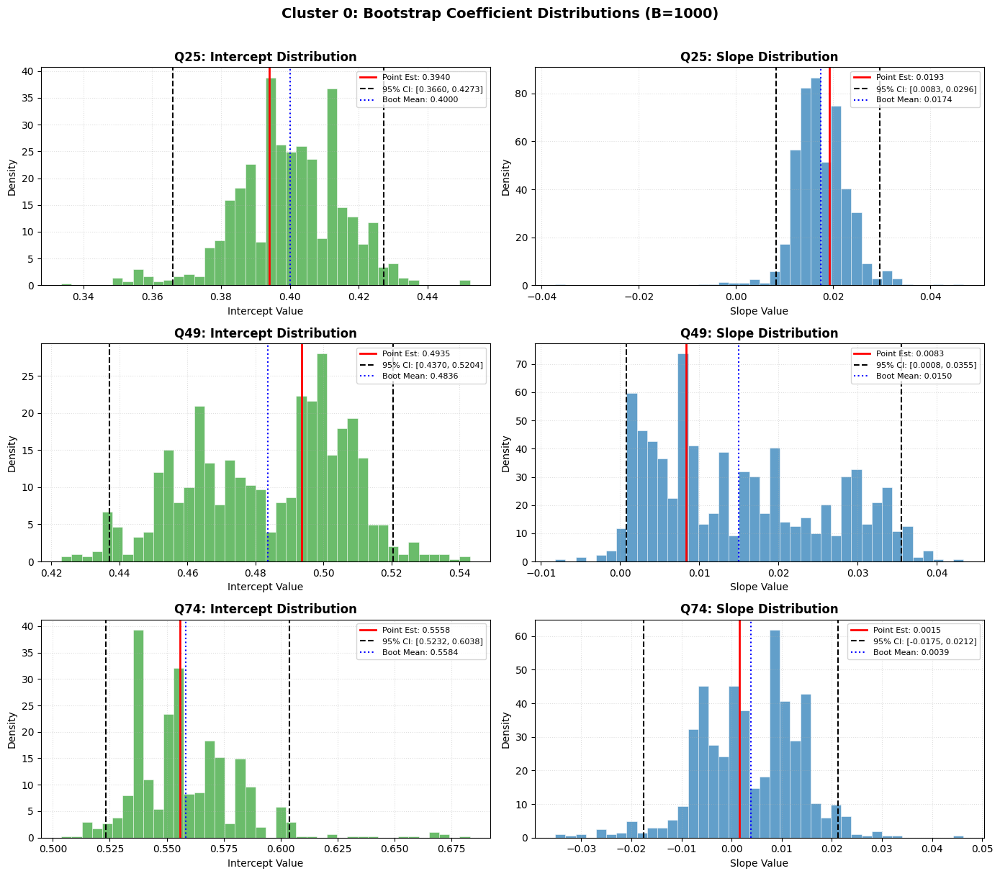

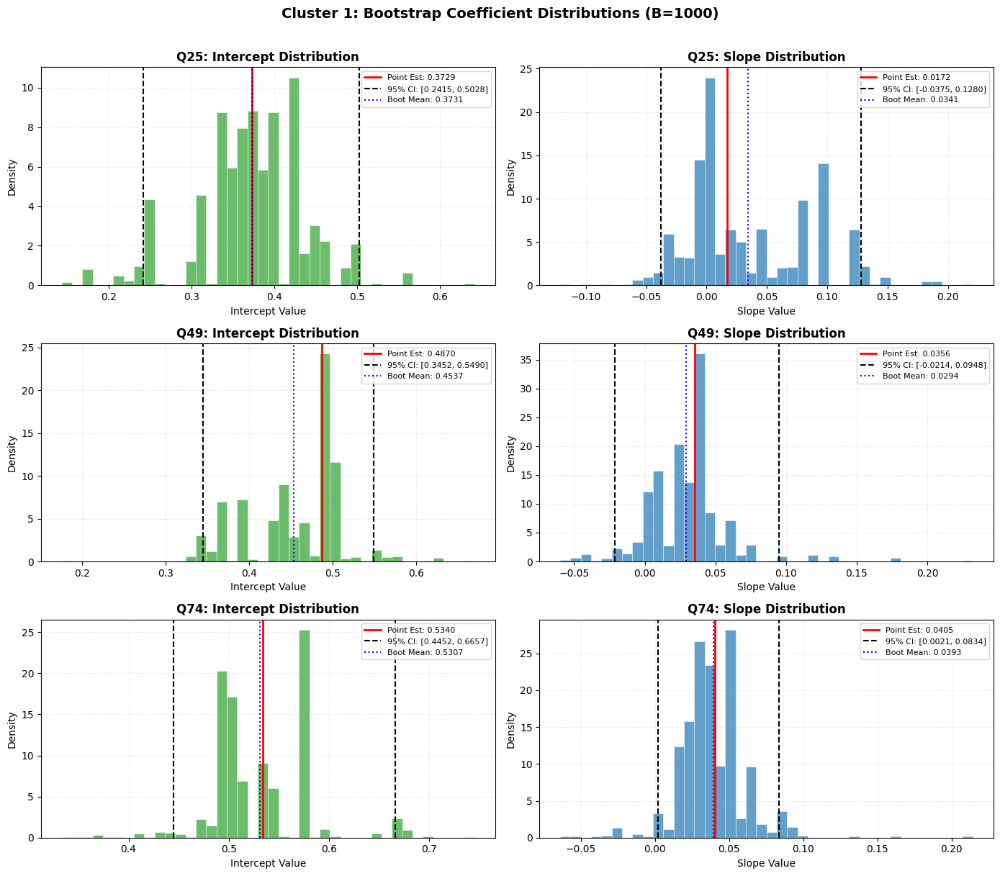

In [15]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# BOOTSTRAP DISTRIBUTION HISTOGRAMS FOR KEY QUANTILES
# ============================================================================

# Select key quantiles to visualize
key_quantiles = [0.25, 0.5, 0.75]  # Q25, Median, Q75
# Find closest available quantiles
available_q = np.array(quantile_levels)
selected_quantiles = [available_q[np.argmin(np.abs(available_q - kq))] for kq in key_quantiles]
selected_quantiles = list(set(selected_quantiles))  # Remove duplicates
selected_quantiles.sort()

print(f"Visualizing bootstrap distributions for quantiles: {selected_quantiles}")

for cluster_id in sorted(bootstrap_results.keys()):
    boot_res = bootstrap_results[cluster_id]
    reg_res = regression_results[cluster_id]
    boot_coeffs = boot_res['boot_coeffs']
    qr_models = reg_res['qr_models']
    
    n_q = len(selected_quantiles)
    fig, axes = plt.subplots(n_q, 2, figsize=(14, 4 * n_q))
    
    if n_q == 1:
        axes = axes.reshape(1, -1)
    
    for i, q in enumerate(selected_quantiles):
        # Get bootstrap samples
        intercepts = np.array(boot_coeffs[q]['intercept'])
        slopes = np.array(boot_coeffs[q]['slope'])
        intercepts = intercepts[~np.isnan(intercepts)]
        slopes = slopes[~np.isnan(slopes)]
        
        # Original point estimates
        orig_intercept = qr_models[q].params[0]
        orig_slope = qr_models[q].params[1]
        
        # Bootstrap CIs
        ci_int = (np.percentile(intercepts, 2.5), np.percentile(intercepts, 97.5))
        ci_slope = (np.percentile(slopes, 2.5), np.percentile(slopes, 97.5))
        
        # --- Intercept Histogram ---
        ax = axes[i, 0]
        ax.hist(intercepts, bins=40, density=True, alpha=0.7, color='#2ca02c', 
                edgecolor='white', linewidth=0.5)
        ax.axvline(orig_intercept, color='red', linewidth=2, linestyle='-', 
                   label=f'Point Est: {orig_intercept:.4f}')
        ax.axvline(ci_int[0], color='black', linewidth=1.5, linestyle='--', 
                   label=f'95% CI: [{ci_int[0]:.4f}, {ci_int[1]:.4f}]')
        ax.axvline(ci_int[1], color='black', linewidth=1.5, linestyle='--')
        ax.axvline(np.mean(intercepts), color='blue', linewidth=1.5, linestyle=':', 
                   label=f'Boot Mean: {np.mean(intercepts):.4f}')
        
        ax.set_title(f'Q{int(q*100)}: Intercept Distribution', fontsize=12, fontweight='bold')
        ax.set_xlabel('Intercept Value', fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        ax.legend(loc='upper right', fontsize=8)
        ax.grid(True, linestyle=':', alpha=0.4)
        
        # --- Slope Histogram ---
        ax = axes[i, 1]
        ax.hist(slopes, bins=40, density=True, alpha=0.7, color='#1f77b4', 
                edgecolor='white', linewidth=0.5)
        ax.axvline(orig_slope, color='red', linewidth=2, linestyle='-', 
                   label=f'Point Est: {orig_slope:.4f}')
        ax.axvline(ci_slope[0], color='black', linewidth=1.5, linestyle='--', 
                   label=f'95% CI: [{ci_slope[0]:.4f}, {ci_slope[1]:.4f}]')
        ax.axvline(ci_slope[1], color='black', linewidth=1.5, linestyle='--')
        ax.axvline(np.mean(slopes), color='blue', linewidth=1.5, linestyle=':', 
                   label=f'Boot Mean: {np.mean(slopes):.4f}')
        
        ax.set_title(f'Q{int(q*100)}: Slope Distribution', fontsize=12, fontweight='bold')
        ax.set_xlabel('Slope Value', fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        ax.legend(loc='upper right', fontsize=8)
        ax.grid(True, linestyle=':', alpha=0.4)
    
    plt.suptitle(f'Cluster {int(cluster_id)}: Bootstrap Coefficient Distributions (B={N_BOOTSTRAP})', 
                 fontsize=14, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

### Summary Table: Bootstrap CI Estimates for All Quantiles

In [16]:
import pandas as pd

# ============================================================================
# CREATE SUMMARY DATAFRAME WITH BOOTSTRAP CI ESTIMATES
# ============================================================================

all_summary_rows = []

for cluster_id in sorted(bootstrap_results.keys()):
    boot_res = bootstrap_results[cluster_id]
    reg_res = regression_results[cluster_id]
    summary = boot_res['summary']
    qr_models = reg_res['qr_models']
    
    for i, q in enumerate(summary['quantiles']):
        # Get asymptotic CIs for comparison
        model = qr_models[q]
        asym_ci = model.conf_int(alpha=ALPHA)
        
        row = {
            'Cluster': int(cluster_id),
            'Quantile': q,
            # Intercept
            'Intercept_Est': model.params[0],
            'Intercept_Boot_Mean': summary['intercept_mean'][i],
            'Intercept_Boot_Std': summary['intercept_std'][i],
            'Intercept_Boot_CI_Low': summary['intercept_ci_low'][i],
            'Intercept_Boot_CI_High': summary['intercept_ci_high'][i],
            'Intercept_Asym_CI_Low': asym_ci[0][0],
            'Intercept_Asym_CI_High': asym_ci[0][1],
            # Slope
            'Slope_Est': model.params[1],
            'Slope_Boot_Mean': summary['slope_mean'][i],
            'Slope_Boot_Std': summary['slope_std'][i],
            'Slope_Boot_CI_Low': summary['slope_ci_low'][i],
            'Slope_Boot_CI_High': summary['slope_ci_high'][i],
            'Slope_Asym_CI_Low': asym_ci[1][0],
            'Slope_Asym_CI_High': asym_ci[1][1],
        }
        all_summary_rows.append(row)

# Create DataFrame
bootstrap_summary_df = pd.DataFrame(all_summary_rows)

# Display styled table for each cluster
for cluster_id in sorted(bootstrap_results.keys()):
    cluster_df = bootstrap_summary_df[bootstrap_summary_df['Cluster'] == cluster_id].copy()
    
    # Format for display
    display_df = cluster_df[['Quantile', 'Slope_Est', 'Slope_Boot_Mean', 
                              'Slope_Boot_CI_Low', 'Slope_Boot_CI_High',
                              'Slope_Asym_CI_Low', 'Slope_Asym_CI_High']].copy()
    display_df.columns = ['τ', 'β̂', 'Boot Mean', 'Boot CI Low', 'Boot CI High', 
                          'Asym CI Low', 'Asym CI High']
    
    print(f"\n{'='*80}")
    print(f"Cluster {int(cluster_id)}: Slope Coefficient Summary")
    print(f"{'='*80}")
    print(display_df.to_string(index=False, float_format='{:.4f}'.format))

# Summary statistics
print(f"\n{'='*80}")
print("OVERALL BOOTSTRAP ANALYSIS SUMMARY")
print(f"{'='*80}")
print(f"  Bootstrap Iterations: {N_BOOTSTRAP}")
print(f"  Confidence Level: {(1-ALPHA)*100:.0f}%")
print(f"  Quantile Levels: {len(quantile_levels)} (from {min(quantile_levels):.2f} to {max(quantile_levels):.2f})")
print(f"  Clusters Analyzed: {len(bootstrap_results)}")
print(f"\nFull summary stored in 'bootstrap_summary_df' DataFrame")

# Display a sample of the full DataFrame
bootstrap_summary_df.round(4)


Cluster 0: Slope Coefficient Summary
     τ      β̂  Boot Mean  Boot CI Low  Boot CI High  Asym CI Low  Asym CI High
0.2000  0.0162     0.0176       0.0039        0.0324      -0.0052        0.0377
0.2500  0.0193     0.0174       0.0083        0.0296      -0.0011        0.0396
0.3000  0.0190     0.0177       0.0089        0.0313       0.0004        0.0375
0.3500  0.0164     0.0182       0.0053        0.0358      -0.0013        0.0340
0.4000  0.0192     0.0180       0.0031        0.0362       0.0020        0.0365
0.4500  0.0158     0.0169       0.0017        0.0362      -0.0004        0.0320
0.5000  0.0083     0.0150       0.0008        0.0355      -0.0073        0.0238
0.5500  0.0092     0.0129      -0.0003        0.0334      -0.0056        0.0240
0.6000  0.0079     0.0108      -0.0020        0.0307      -0.0073        0.0231
0.6500  0.0083     0.0090      -0.0030        0.0273      -0.0061        0.0228
0.7000  0.0090     0.0069      -0.0069        0.0266      -0.0052        0.0232
0.

,Cluster,Quantile,Intercept_Est,Intercept_Boot_Mean,Intercept_Boot_Std,Intercept_Boot_CI_Low,Intercept_Boot_CI_High,Intercept_Asym_CI_Low,Intercept_Asym_CI_High,Slope_Est,Slope_Boot_Mean,Slope_Boot_Std,Slope_Boot_CI_Low,Slope_Boot_CI_High,Slope_Asym_CI_Low,Slope_Asym_CI_High
0,0,0.20,0.3834,0.3827,0.0179,0.3441,0.4136,0.3442,0.4226,0.0162,0.0176,0.0067,0.0039,0.0324,-0.0052,0.0377
1,0,0.25,0.3940,0.4000,0.0154,0.3660,0.4273,0.3540,0.4339,0.0193,0.0174,0.0056,0.0083,0.0296,-0.0011,0.0396
2,0,0.30,0.4136,0.4154,0.0154,0.3868,0.4486,0.3757,0.4514,0.0190,0.0177,0.0059,0.0089,0.0313,0.0004,0.0375
3,0,0.35,0.4263,0.4301,0.0176,0.3986,0.4780,0.3883,0.4643,0.0164,0.0182,0.0074,0.0053,0.0358,-0.0013,0.0340
4,0,0.40,0.4369,0.4466,0.0216,0.4135,0.4958,0.3998,0.4741,0.0192,0.0180,0.0090,0.0031,0.0362,0.0020,0.0365
5,0,0.45,0.4547,0.4650,0.0235,0.4263,0.5097,0.4182,0.4912,0.0158,0.0169,0.0103,0.0017,0.0362,-0.0004,0.0320
6,0,0.50,0.4935,0.4836,0.0233,0.4370,0.5204,0.4571,0.5300,0.0083,0.0150,0.0109,0.0008,0.0355,-0.0073,0.0238
7,0,0.55,0.5007,0.5005,0.0202,0.4540,0.5351,0.4648,0.5367,0.0092,0.0129,0.0103,-0.0003,0.0334,-0.0056,0.0240
8,0,0.60,0.5253,0.5162,0.0174,0.4730,0.5445,0.4875,0.5631,0.0079,0.0108,0.0094,-0.0020,0.0307,-0.0073,0.0231
9,0,0.65,0.5308,0.5293,0.0159,0.4988,0.5558,0.4940,0.5677,0.0083,0.0090,0.0088,-0.0030,0.0273,-0.0061,0.0228


## Bootstrap CIs with synthetic response values

The **synthetic response bootstrap** (also called residual bootstrap or wild bootstrap) differs from the basic paired bootstrap:

1. **Basic Bootstrap**: Resamples observed $(X_i, Y_i)$ pairs with replacement
2. **Synthetic Response Bootstrap**: 
   - Fits the model on original data to get residuals $\hat{e}_i = Y_i - \hat{Y}_i$
   - Generates synthetic responses: $Y_i^* = \hat{Y}_i + e^*_i$ where $e^*_i$ are resampled residuals
   - Refits the model on $(X_i, Y_i^*)$

This method preserves the original X design and is particularly useful when the X values are fixed by design.

In [19]:
import numpy as np
import statsmodels.api as sm
from tqdm import tqdm

# ============================================================================
# SYNTHETIC RESPONSE BOOTSTRAP (RESIDUAL BOOTSTRAP) FOR QUANTILE REGRESSION
# ============================================================================
# This method:
# 1. Fits the model on original data to get fitted values and residuals
# 2. Resamples residuals (with replacement) to create synthetic responses
# 3. Refits the model on (X, Y*) where Y* = fitted + resampled_residuals
# ============================================================================

# Bootstrap parameters (same as basic bootstrap for fair comparison)
N_BOOTSTRAP_SYNTH = 1000  # Number of bootstrap iterations
ALPHA_SYNTH = 0.05        # Significance level for 95% CI
np.random.seed(123)       # Different seed for reproducibility

print(f"Synthetic Response Bootstrap Configuration:")
print(f"  Number of iterations: {N_BOOTSTRAP_SYNTH}")
print(f"  Confidence Level: {(1 - ALPHA_SYNTH) * 100:.0f}%")
print(f"  Quantile levels: {quantile_levels}")
print(f"  Method: Residual resampling (preserves X design)")

# Dictionary to store synthetic bootstrap results
synthetic_bootstrap_results = {}

# Perform synthetic bootstrap for each cluster
for cluster_id in sorted(regression_results.keys()):
    print(f"\n{'='*60}")
    print(f"Cluster {int(cluster_id)}: Running Synthetic Response Bootstrap...")
    print(f"{'='*60}")
    
    res = regression_results[cluster_id]
    X = res['X']
    X_const = res['X_with_const']
    y = res['y']
    n = len(y)
    ols_model = res['ols_model']
    qr_models = res['qr_models']
    
    # =========================================================================
    # Step 1: Compute fitted values and residuals from original fits
    # =========================================================================
    
    # OLS residuals
    ols_fitted = ols_model.predict(X_const)
    ols_residuals = y - ols_fitted
    
    # QR residuals for each quantile
    qr_fitted = {}
    qr_residuals = {}
    for q in quantile_levels:
        qr_fitted[q] = qr_models[q].predict(X_const)
        qr_residuals[q] = y - qr_fitted[q]
    
    # Arrays to store bootstrap coefficients
    synth_boot_coeffs = {q: {'intercept': [], 'slope': []} for q in quantile_levels}
    synth_boot_ols_coeffs = {'intercept': [], 'slope': []}
    
    # =========================================================================
    # Step 2: Synthetic Response Bootstrap Loop
    # =========================================================================
    for b in tqdm(range(N_BOOTSTRAP_SYNTH), desc=f"Cluster {int(cluster_id)}"):
        # Resample residual indices with replacement
        boot_indices = np.random.choice(n, size=n, replace=True)
        
        # ----- OLS Synthetic Response -----
        ols_resid_boot = ols_residuals[boot_indices]
        y_synth_ols = ols_fitted + ols_resid_boot
        
        try:
            ols_boot = sm.OLS(y_synth_ols, X_const).fit()
            synth_boot_ols_coeffs['intercept'].append(ols_boot.params[0])
            synth_boot_ols_coeffs['slope'].append(ols_boot.params[1])
        except:
            synth_boot_ols_coeffs['intercept'].append(np.nan)
            synth_boot_ols_coeffs['slope'].append(np.nan)
        
        # ----- QR Synthetic Response for each quantile -----
        for q in quantile_levels:
            resid_boot = qr_residuals[q][boot_indices]
            y_synth = qr_fitted[q] + resid_boot
            
            try:
                qr_boot = sm.QuantReg(y_synth, X_const).fit(q=q, max_iter=1000)
                synth_boot_coeffs[q]['intercept'].append(qr_boot.params[0])
                synth_boot_coeffs[q]['slope'].append(qr_boot.params[1])
            except:
                synth_boot_coeffs[q]['intercept'].append(np.nan)
                synth_boot_coeffs[q]['slope'].append(np.nan)
    
    # =========================================================================
    # Step 3: Calculate Bootstrap CIs using percentile method
    # =========================================================================
    ci_lower = ALPHA_SYNTH / 2
    ci_upper = 1 - ALPHA_SYNTH / 2
    
    synth_summary = {
        'quantiles': [],
        'intercept_mean': [],
        'intercept_std': [],
        'intercept_ci_low': [],
        'intercept_ci_high': [],
        'slope_mean': [],
        'slope_std': [],
        'slope_ci_low': [],
        'slope_ci_high': [],
    }
    
    for q in quantile_levels:
        intercepts = np.array(synth_boot_coeffs[q]['intercept'])
        slopes = np.array(synth_boot_coeffs[q]['slope'])
        
        # Remove NaNs
        intercepts = intercepts[~np.isnan(intercepts)]
        slopes = slopes[~np.isnan(slopes)]
        
        synth_summary['quantiles'].append(q)
        synth_summary['intercept_mean'].append(np.mean(intercepts))
        synth_summary['intercept_std'].append(np.std(intercepts))
        synth_summary['intercept_ci_low'].append(np.percentile(intercepts, ci_lower * 100))
        synth_summary['intercept_ci_high'].append(np.percentile(intercepts, ci_upper * 100))
        synth_summary['slope_mean'].append(np.mean(slopes))
        synth_summary['slope_std'].append(np.std(slopes))
        synth_summary['slope_ci_low'].append(np.percentile(slopes, ci_lower * 100))
        synth_summary['slope_ci_high'].append(np.percentile(slopes, ci_upper * 100))
    
    # OLS bootstrap summary
    ols_intercepts = np.array(synth_boot_ols_coeffs['intercept'])
    ols_slopes = np.array(synth_boot_ols_coeffs['slope'])
    ols_intercepts = ols_intercepts[~np.isnan(ols_intercepts)]
    ols_slopes = ols_slopes[~np.isnan(ols_slopes)]
    
    synth_ols_summary = {
        'intercept_mean': np.mean(ols_intercepts),
        'intercept_std': np.std(ols_intercepts),
        'intercept_ci': (np.percentile(ols_intercepts, ci_lower * 100), 
                         np.percentile(ols_intercepts, ci_upper * 100)),
        'slope_mean': np.mean(ols_slopes),
        'slope_std': np.std(ols_slopes),
        'slope_ci': (np.percentile(ols_slopes, ci_lower * 100), 
                     np.percentile(ols_slopes, ci_upper * 100)),
    }
    
    # Store results
    synthetic_bootstrap_results[cluster_id] = {
        'boot_coeffs': synth_boot_coeffs,
        'boot_ols_coeffs': synth_boot_ols_coeffs,
        'summary': synth_summary,
        'ols_summary': synth_ols_summary,
    }
    
    print(f"\n  OLS Synthetic Bootstrap Summary:")
    print(f"    Intercept: {synth_ols_summary['intercept_mean']:.4f} ± {synth_ols_summary['intercept_std']:.4f}")
    print(f"    Intercept 95% CI: [{synth_ols_summary['intercept_ci'][0]:.4f}, {synth_ols_summary['intercept_ci'][1]:.4f}]")
    print(f"    Slope: {synth_ols_summary['slope_mean']:.4f} ± {synth_ols_summary['slope_std']:.4f}")
    print(f"    Slope 95% CI: [{synth_ols_summary['slope_ci'][0]:.4f}, {synth_ols_summary['slope_ci'][1]:.4f}]")

print("\n" + "="*60)
print("✓ Synthetic Response Bootstrap completed for all clusters!")
print("="*60)

Synthetic Response Bootstrap Configuration:
  Number of iterations: 1000
  Confidence Level: 95%
  Quantile levels: [0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8 ]
  Method: Residual resampling (preserves X design)

Cluster 0: Running Synthetic Response Bootstrap...


Cluster 0:  15%|█▌        | 150/1000 [00:04<00:23, 36.66it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 0:  20%|██        | 200/1000 [00:05<00:21, 37.00it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 0:  26%|██▋       | 265/1000 [00:07<00:20, 35.49it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximu


  OLS Synthetic Bootstrap Summary:
    Intercept: 0.4858 ± 0.0140
    Intercept 95% CI: [0.4587, 0.5136]
    Slope: 0.0098 ± 0.0062
    Slope 95% CI: [-0.0022, 0.0222]

Cluster 1: Running Synthetic Response Bootstrap...


Cluster 1:   1%|          | 10/1000 [00:00<00:25, 38.41it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 1:   2%|▏         | 24/1000 [00:00<00:25, 38.41it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
Cluster 1:   4%|▍  


  OLS Synthetic Bootstrap Summary:
    Intercept: 0.4545 ± 0.0403
    Intercept 95% CI: [0.3731, 0.5322]
    Slope: 0.0363 ± 0.0234
    Slope 95% CI: [-0.0083, 0.0824]

✓ Synthetic Response Bootstrap completed for all clusters!


### Comparison: Basic Bootstrap vs Synthetic Response Bootstrap

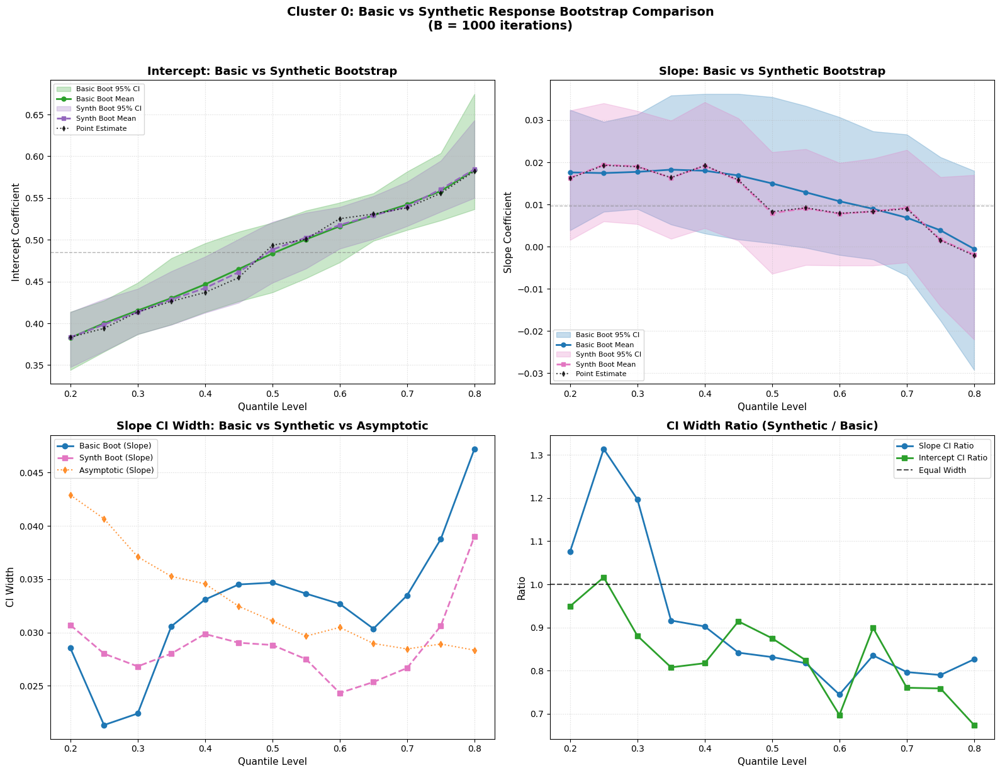


Cluster 0: Bootstrap Method Comparison (Slope Coefficient)

Quantile   Basic CI                  Synthetic CI              Width Ratio  Mean Diff   
------------------------------------------------------------------------------------
0.20       [ 0.0039,  0.0324]        [ 0.0016,  0.0323]             1.076     -0.00126
0.25       [ 0.0083,  0.0296]        [ 0.0060,  0.0340]             1.314     +0.00195
0.30       [ 0.0089,  0.0313]        [ 0.0054,  0.0322]             1.197     +0.00130
0.35       [ 0.0053,  0.0358]        [ 0.0019,  0.0299]             0.916     -0.00193
0.40       [ 0.0031,  0.0362]        [ 0.0044,  0.0343]             0.902     +0.00117
0.45       [ 0.0017,  0.0362]        [ 0.0014,  0.0304]             0.842     -0.00123
0.50       [ 0.0008,  0.0355]        [-0.0064,  0.0224]             0.831     -0.00706
0.55       [-0.0003,  0.0334]        [-0.0044,  0.0231]             0.817     -0.00379
0.60       [-0.0020,  0.0307]        [-0.0045,  0.0199]             0

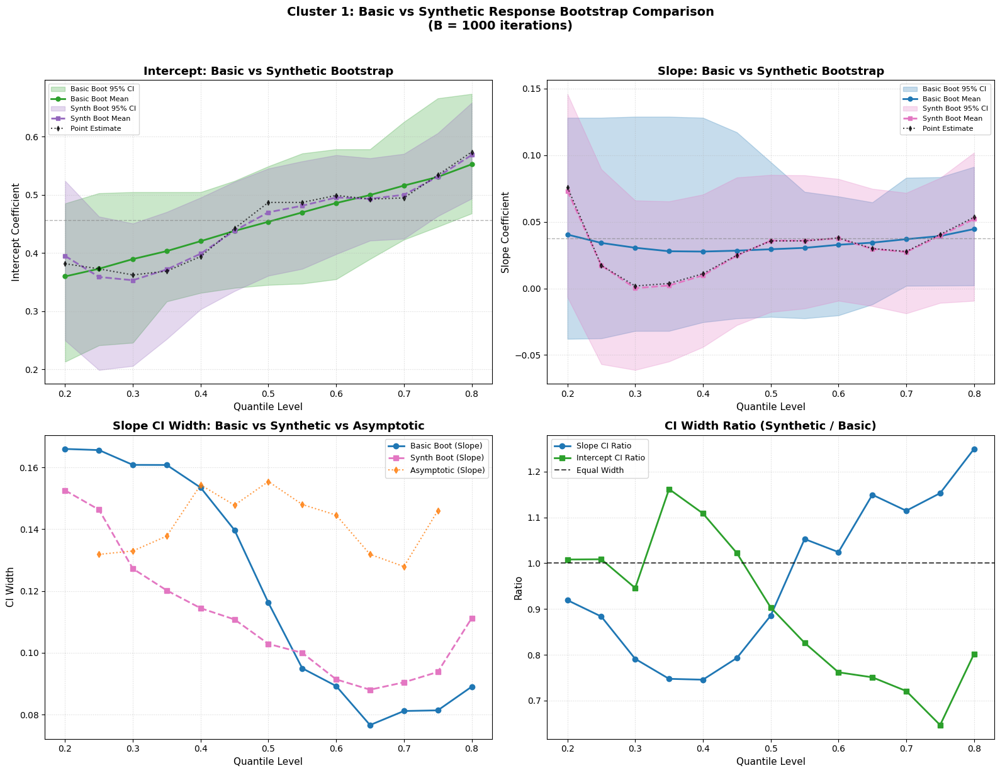


Cluster 1: Bootstrap Method Comparison (Slope Coefficient)

Quantile   Basic CI                  Synthetic CI              Width Ratio  Mean Diff   
------------------------------------------------------------------------------------
0.20       [-0.0379,  0.1280]        [-0.0066,  0.1460]             0.919     +0.03276
0.25       [-0.0375,  0.1280]        [-0.0569,  0.0894]             0.883     -0.01689
0.30       [-0.0320,  0.1288]        [-0.0612,  0.0660]             0.791     -0.03036
0.35       [-0.0319,  0.1288]        [-0.0549,  0.0653]             0.747     -0.02570
0.40       [-0.0254,  0.1280]        [-0.0440,  0.0704]             0.746     -0.01788
0.45       [-0.0225,  0.1171]        [-0.0276,  0.0832]             0.793     -0.00374
0.50       [-0.0214,  0.0948]        [-0.0177,  0.0851]             0.885     +0.00643
0.55       [-0.0225,  0.0724]        [-0.0151,  0.0849]             1.053     +0.00540
0.60       [-0.0202,  0.0690]        [-0.0093,  0.0821]             1

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# VISUALIZATION: COMPARISON OF BASIC VS SYNTHETIC RESPONSE BOOTSTRAP CIs
# ============================================================================

for cluster_id in sorted(bootstrap_results.keys()):
    # Get results from both methods
    basic_res = bootstrap_results[cluster_id]
    synth_res = synthetic_bootstrap_results[cluster_id]
    reg_res = regression_results[cluster_id]
    
    basic_summary = basic_res['summary']
    synth_summary = synth_res['summary']
    qr_models = reg_res['qr_models']
    ols_model = reg_res['ols_model']
    
    sorted_q = np.array(basic_summary['quantiles'])
    
    # Create figure with 2x2 panels
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # =========================================================================
    # Panel 1: Intercept - Basic vs Synthetic Bootstrap CIs
    # =========================================================================
    ax = axes[0, 0]
    
    # Basic bootstrap
    ax.fill_between(sorted_q, basic_summary['intercept_ci_low'], basic_summary['intercept_ci_high'],
                    color='#2ca02c', alpha=0.25, label='Basic Boot 95% CI')
    ax.plot(sorted_q, basic_summary['intercept_mean'], 'o-', color='#2ca02c', 
            markersize=5, linewidth=2, label='Basic Boot Mean')
    
    # Synthetic bootstrap
    ax.fill_between(sorted_q, synth_summary['intercept_ci_low'], synth_summary['intercept_ci_high'],
                    color='#9467bd', alpha=0.25, label='Synth Boot 95% CI')
    ax.plot(sorted_q, synth_summary['intercept_mean'], 's--', color='#9467bd', 
            markersize=5, linewidth=2, label='Synth Boot Mean')
    
    # Point estimates from original fit
    point_est = [qr_models[q].params[0] for q in sorted_q]
    ax.plot(sorted_q, point_est, 'd:', color='black', markersize=4, 
            linewidth=1.5, alpha=0.7, label='Point Estimate')
    
    # OLS reference
    ax.axhline(ols_model.params[0], color='gray', linestyle='--', linewidth=1, alpha=0.6)
    
    ax.set_title('Intercept: Basic vs Synthetic Bootstrap', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('Intercept Coefficient', fontsize=11)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # =========================================================================
    # Panel 2: Slope - Basic vs Synthetic Bootstrap CIs
    # =========================================================================
    ax = axes[0, 1]
    
    # Basic bootstrap
    ax.fill_between(sorted_q, basic_summary['slope_ci_low'], basic_summary['slope_ci_high'],
                    color='#1f77b4', alpha=0.25, label='Basic Boot 95% CI')
    ax.plot(sorted_q, basic_summary['slope_mean'], 'o-', color='#1f77b4', 
            markersize=5, linewidth=2, label='Basic Boot Mean')
    
    # Synthetic bootstrap
    ax.fill_between(sorted_q, synth_summary['slope_ci_low'], synth_summary['slope_ci_high'],
                    color='#e377c2', alpha=0.25, label='Synth Boot 95% CI')
    ax.plot(sorted_q, synth_summary['slope_mean'], 's--', color='#e377c2', 
            markersize=5, linewidth=2, label='Synth Boot Mean')
    
    # Point estimates
    slope_est = [qr_models[q].params[1] for q in sorted_q]
    ax.plot(sorted_q, slope_est, 'd:', color='black', markersize=4, 
            linewidth=1.5, alpha=0.7, label='Point Estimate')
    
    # OLS reference
    ax.axhline(ols_model.params[1], color='gray', linestyle='--', linewidth=1, alpha=0.6)
    
    ax.set_title('Slope: Basic vs Synthetic Bootstrap', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('Slope Coefficient', fontsize=11)
    ax.legend(loc='best', fontsize=8)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # =========================================================================
    # Panel 3: CI Width Comparison (Slope)
    # =========================================================================
    ax = axes[1, 0]
    
    # Calculate CI widths
    basic_slope_width = np.array(basic_summary['slope_ci_high']) - np.array(basic_summary['slope_ci_low'])
    synth_slope_width = np.array(synth_summary['slope_ci_high']) - np.array(synth_summary['slope_ci_low'])
    basic_int_width = np.array(basic_summary['intercept_ci_high']) - np.array(basic_summary['intercept_ci_low'])
    synth_int_width = np.array(synth_summary['intercept_ci_high']) - np.array(synth_summary['intercept_ci_low'])
    
    # Get asymptotic widths for reference
    asym_slope_width = []
    for q in sorted_q:
        conf = qr_models[q].conf_int(alpha=0.05)
        asym_slope_width.append(conf[1][1] - conf[1][0])
    asym_slope_width = np.array(asym_slope_width)
    
    ax.plot(sorted_q, basic_slope_width, 'o-', color='#1f77b4', 
            linewidth=2, markersize=6, label='Basic Boot (Slope)')
    ax.plot(sorted_q, synth_slope_width, 's--', color='#e377c2', 
            linewidth=2, markersize=6, label='Synth Boot (Slope)')
    ax.plot(sorted_q, asym_slope_width, 'd:', color='#ff7f0e', 
            linewidth=1.5, markersize=5, alpha=0.8, label='Asymptotic (Slope)')
    
    ax.set_title('Slope CI Width: Basic vs Synthetic vs Asymptotic', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('CI Width', fontsize=11)
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    # =========================================================================
    # Panel 4: CI Width Ratio (Synthetic / Basic)
    # =========================================================================
    ax = axes[1, 1]
    
    slope_ratio = synth_slope_width / basic_slope_width
    int_ratio = synth_int_width / basic_int_width
    
    ax.plot(sorted_q, slope_ratio, 'o-', color='#1f77b4', 
            linewidth=2, markersize=6, label='Slope CI Ratio')
    ax.plot(sorted_q, int_ratio, 's-', color='#2ca02c', 
            linewidth=2, markersize=6, label='Intercept CI Ratio')
    ax.axhline(1.0, color='black', linestyle='--', linewidth=1.5, alpha=0.7, label='Equal Width')
    
    ax.set_title('CI Width Ratio (Synthetic / Basic)', fontsize=13, fontweight='bold')
    ax.set_xlabel('Quantile Level', fontsize=11)
    ax.set_ylabel('Ratio', fontsize=11)
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, linestyle=':', alpha=0.5)
    
    plt.suptitle(f'Cluster {int(cluster_id)}: Basic vs Synthetic Response Bootstrap Comparison\n(B = {N_BOOTSTRAP} iterations)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
    
    # Print comparison statistics
    print(f"\n{'='*90}")
    print(f"Cluster {int(cluster_id)}: Bootstrap Method Comparison (Slope Coefficient)")
    print(f"{'='*90}")
    print(f"\n{'Quantile':<10} {'Basic CI':<25} {'Synthetic CI':<25} {'Width Ratio':<12} {'Mean Diff':<12}")
    print("-" * 84)
    for i, q in enumerate(sorted_q):
        basic_ci = f"[{basic_summary['slope_ci_low'][i]:>7.4f}, {basic_summary['slope_ci_high'][i]:>7.4f}]"
        synth_ci = f"[{synth_summary['slope_ci_low'][i]:>7.4f}, {synth_summary['slope_ci_high'][i]:>7.4f}]"
        ratio = slope_ratio[i]
        mean_diff = synth_summary['slope_mean'][i] - basic_summary['slope_mean'][i]
        print(f"{q:<10.2f} {basic_ci:<25} {synth_ci:<25} {ratio:>10.3f}   {mean_diff:>+10.5f}")
    print()

### Summary Table: Bootstrap Methods Comparison

In [21]:
import pandas as pd
import numpy as np

# ============================================================================
# CREATE COMPREHENSIVE COMPARISON DATAFRAME
# ============================================================================

comparison_rows = []

for cluster_id in sorted(bootstrap_results.keys()):
    basic_res = bootstrap_results[cluster_id]
    synth_res = synthetic_bootstrap_results[cluster_id]
    reg_res = regression_results[cluster_id]
    
    basic_summary = basic_res['summary']
    synth_summary = synth_res['summary']
    qr_models = reg_res['qr_models']
    
    for i, q in enumerate(basic_summary['quantiles']):
        model = qr_models[q]
        asym_ci = model.conf_int(alpha=0.05)
        
        # Calculate CI widths
        basic_slope_width = basic_summary['slope_ci_high'][i] - basic_summary['slope_ci_low'][i]
        synth_slope_width = synth_summary['slope_ci_high'][i] - synth_summary['slope_ci_low'][i]
        asym_slope_width = asym_ci[1][1] - asym_ci[1][0]
        
        basic_int_width = basic_summary['intercept_ci_high'][i] - basic_summary['intercept_ci_low'][i]
        synth_int_width = synth_summary['intercept_ci_high'][i] - synth_summary['intercept_ci_low'][i]
        asym_int_width = asym_ci[0][1] - asym_ci[0][0]
        
        row = {
            'Cluster': int(cluster_id),
            'Quantile': q,
            # Slope estimates
            'Slope_Point_Est': model.params[1],
            'Slope_Basic_Mean': basic_summary['slope_mean'][i],
            'Slope_Synth_Mean': synth_summary['slope_mean'][i],
            # Slope CIs
            'Slope_Basic_CI_Low': basic_summary['slope_ci_low'][i],
            'Slope_Basic_CI_High': basic_summary['slope_ci_high'][i],
            'Slope_Synth_CI_Low': synth_summary['slope_ci_low'][i],
            'Slope_Synth_CI_High': synth_summary['slope_ci_high'][i],
            'Slope_Asym_CI_Low': asym_ci[1][0],
            'Slope_Asym_CI_High': asym_ci[1][1],
            # CI widths
            'Slope_Basic_Width': basic_slope_width,
            'Slope_Synth_Width': synth_slope_width,
            'Slope_Asym_Width': asym_slope_width,
            # Width ratios
            'Slope_Synth_Basic_Ratio': synth_slope_width / basic_slope_width if basic_slope_width > 0 else np.nan,
            'Slope_Basic_Asym_Ratio': basic_slope_width / asym_slope_width if asym_slope_width > 0 else np.nan,
            # Standard deviations
            'Slope_Basic_Std': basic_summary['slope_std'][i],
            'Slope_Synth_Std': synth_summary['slope_std'][i],
            # Intercept CI widths
            'Int_Basic_Width': basic_int_width,
            'Int_Synth_Width': synth_int_width,
            'Int_Asym_Width': asym_int_width,
        }
        comparison_rows.append(row)

# Create DataFrame
comparison_df = pd.DataFrame(comparison_rows)

# Display summary for each cluster
for cluster_id in sorted(bootstrap_results.keys()):
    cluster_df = comparison_df[comparison_df['Cluster'] == cluster_id].copy()
    
    print(f"\n{'='*100}")
    print(f"Cluster {int(cluster_id)}: Comprehensive Bootstrap Comparison")
    print(f"{'='*100}")
    
    # Slope summary table
    display_cols = ['Quantile', 'Slope_Point_Est', 'Slope_Basic_Mean', 'Slope_Synth_Mean',
                    'Slope_Basic_Width', 'Slope_Synth_Width', 'Slope_Asym_Width', 'Slope_Synth_Basic_Ratio']
    display_df = cluster_df[display_cols].copy()
    display_df.columns = ['τ', 'Point Est', 'Basic Mean', 'Synth Mean', 
                          'Basic Width', 'Synth Width', 'Asym Width', 'S/B Ratio']
    
    print("\nSlope Coefficient Summary:")
    print(display_df.to_string(index=False, float_format='{:.4f}'.format))
    
    # Overall statistics
    print(f"\nOverall Statistics (Slope):")
    print(f"  Mean CI Width - Basic: {cluster_df['Slope_Basic_Width'].mean():.4f}")
    print(f"  Mean CI Width - Synth: {cluster_df['Slope_Synth_Width'].mean():.4f}")
    print(f"  Mean CI Width - Asym:  {cluster_df['Slope_Asym_Width'].mean():.4f}")
    print(f"  Avg Synth/Basic Ratio: {cluster_df['Slope_Synth_Basic_Ratio'].mean():.3f}")
    print(f"  Avg Basic/Asym Ratio:  {cluster_df['Slope_Basic_Asym_Ratio'].mean():.3f}")

# Final summary
print(f"\n{'='*100}")
print("OVERALL SUMMARY: BOOTSTRAP METHOD COMPARISON")
print(f"{'='*100}")
print(f"\n  Basic Bootstrap (Paired Resampling):")
print(f"    - Resamples (X, Y) pairs with replacement")
print(f"    - Preserves original correlation structure")
print(f"    - More robust to model misspecification")
print(f"\n  Synthetic Response Bootstrap (Residual Resampling):")
print(f"    - Preserves original X design")
print(f"    - Resamples residuals to create synthetic Y*")
print(f"    - More efficient when X is fixed by design")
print(f"\n  Bootstrap Iterations: {N_BOOTSTRAP}")
print(f"  Confidence Level: {(1-ALPHA)*100:.0f}%")
print(f"  Quantile Levels Analyzed: {len(quantile_levels)}")

# Store comparison DataFrame
print(f"\nFull comparison stored in 'comparison_df' DataFrame")
comparison_df.round(4)


Cluster 0: Comprehensive Bootstrap Comparison

Slope Coefficient Summary:
     τ  Point Est  Basic Mean  Synth Mean  Basic Width  Synth Width  Asym Width  S/B Ratio
0.2000     0.0162      0.0176      0.0163       0.0285       0.0307      0.0429     1.0756
0.2500     0.0193      0.0174      0.0194       0.0213       0.0280      0.0407     1.3139
0.3000     0.0190      0.0177      0.0190       0.0224       0.0268      0.0371     1.1971
0.3500     0.0164      0.0182      0.0163       0.0306       0.0280      0.0353     0.9162
0.4000     0.0192      0.0180      0.0192       0.0331       0.0299      0.0346     0.9024
0.4500     0.0158      0.0169      0.0156       0.0345       0.0290      0.0325     0.8416
0.5000     0.0083      0.0150      0.0079       0.0347       0.0288      0.0311     0.8314
0.5500     0.0092      0.0129      0.0091       0.0336       0.0275      0.0297     0.8173
0.6000     0.0079      0.0108      0.0078       0.0327       0.0243      0.0305     0.7445
0.6500     0.00

,Cluster,Quantile,Slope_Point_Est,Slope_Basic_Mean,Slope_Synth_Mean,Slope_Basic_CI_Low,Slope_Basic_CI_High,Slope_Synth_CI_Low,Slope_Synth_CI_High,Slope_Asym_CI_Low,...,Slope_Basic_Width,Slope_Synth_Width,Slope_Asym_Width,Slope_Synth_Basic_Ratio,Slope_Basic_Asym_Ratio,Slope_Basic_Std,Slope_Synth_Std,Int_Basic_Width,Int_Synth_Width,Int_Asym_Width
0,0,0.20,0.0162,0.0176,0.0163,0.0039,0.0324,0.0016,0.0323,-0.0052,...,0.0285,0.0307,0.0429,1.0756,0.6655,0.0067,0.0075,0.0695,0.0660,0.0785
1,0,0.25,0.0193,0.0174,0.0194,0.0083,0.0296,0.0060,0.0340,-0.0011,...,0.0213,0.0280,0.0407,1.3139,0.5244,0.0056,0.0070,0.0613,0.0623,0.0799
2,0,0.30,0.0190,0.0177,0.0190,0.0089,0.0313,0.0054,0.0322,0.0004,...,0.0224,0.0268,0.0371,1.1971,0.6039,0.0059,0.0067,0.0617,0.0544,0.0757
3,0,0.35,0.0164,0.0182,0.0163,0.0053,0.0358,0.0019,0.0299,-0.0013,...,0.0306,0.0280,0.0353,0.9162,0.8675,0.0074,0.0070,0.0794,0.0641,0.0760
4,0,0.40,0.0192,0.0180,0.0192,0.0031,0.0362,0.0044,0.0343,0.0020,...,0.0331,0.0299,0.0346,0.9024,0.9573,0.0090,0.0075,0.0823,0.0673,0.0743
5,0,0.45,0.0158,0.0169,0.0156,0.0017,0.0362,0.0014,0.0304,-0.0004,...,0.0345,0.0290,0.0325,0.8416,1.0630,0.0103,0.0080,0.0833,0.0762,0.0730
6,0,0.50,0.0083,0.0150,0.0079,0.0008,0.0355,-0.0064,0.0224,-0.0073,...,0.0347,0.0288,0.0311,0.8314,1.1154,0.0109,0.0077,0.0834,0.0730,0.0729
7,0,0.55,0.0092,0.0129,0.0091,-0.0003,0.0334,-0.0044,0.0231,-0.0056,...,0.0336,0.0275,0.0297,0.8173,1.1342,0.0103,0.0070,0.0810,0.0668,0.0719
8,0,0.60,0.0079,0.0108,0.0078,-0.0020,0.0307,-0.0045,0.0199,-0.0073,...,0.0327,0.0243,0.0305,0.7445,1.0722,0.0094,0.0063,0.0715,0.0498,0.0756
9,0,0.65,0.0083,0.0090,0.0083,-0.0030,0.0273,-0.0045,0.0209,-0.0061,...,0.0304,0.0254,0.0290,0.8352,1.0479,0.0088,0.0061,0.0570,0.0512,0.0736


### Distribution Comparison: Basic vs Synthetic Bootstrap for Key Quantiles

Comparing bootstrap distributions for quantiles: [np.float64(0.25), np.float64(0.49999999999999994), np.float64(0.7499999999999999)]
  Q25 - Slope KS test: D=0.1840, p=0.0000
  Q25 - Int   KS test: D=0.0940, p=0.0003
  Q49 - Slope KS test: D=0.2910, p=0.0000
  Q49 - Int   KS test: D=0.1920, p=0.0000
  Q74 - Slope KS test: D=0.2710, p=0.0000
  Q74 - Int   KS test: D=0.2050, p=0.0000


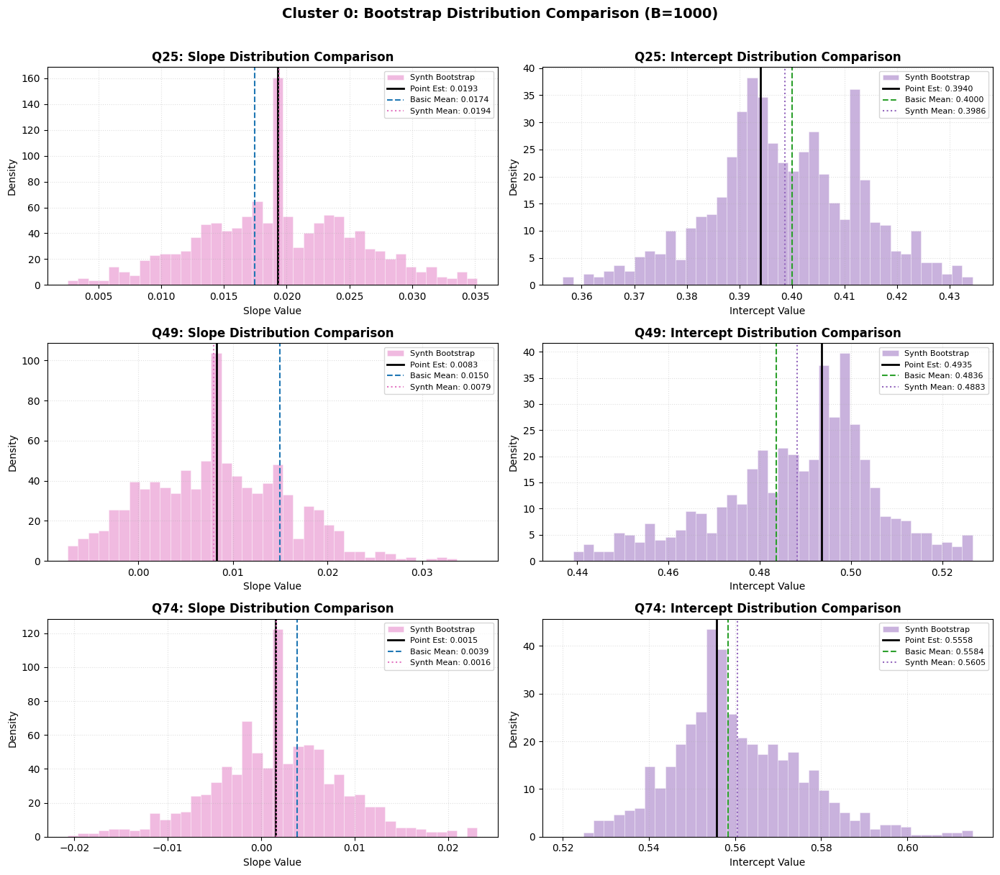


Cluster 0: Statistical Comparison Summary
KS test null hypothesis: both samples come from the same distribution
Small p-value indicates significantly different distributions

  Q25 - Slope KS test: D=0.2410, p=0.0000
  Q25 - Int   KS test: D=0.1140, p=0.0000
  Q49 - Slope KS test: D=0.1810, p=0.0000
  Q49 - Int   KS test: D=0.1630, p=0.0000
  Q74 - Slope KS test: D=0.1050, p=0.0000
  Q74 - Int   KS test: D=0.1870, p=0.0000


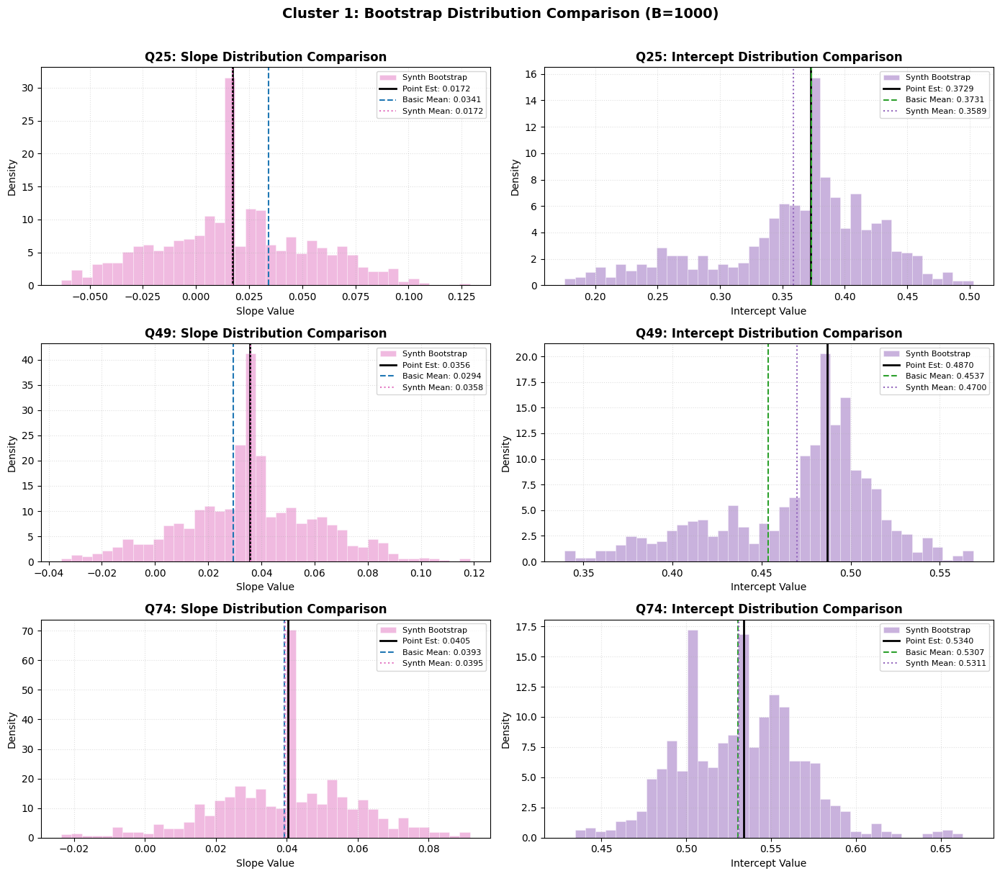


Cluster 1: Statistical Comparison Summary
KS test null hypothesis: both samples come from the same distribution
Small p-value indicates significantly different distributions



In [23]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# ============================================================================
# DISTRIBUTION COMPARISON: BASIC VS SYNTHETIC BOOTSTRAP
# ============================================================================

# Select key quantiles to visualize
key_quantiles = [0.25, 0.5, 0.75]
available_q = np.array(quantile_levels)
selected_quantiles = [available_q[np.argmin(np.abs(available_q - kq))] for kq in key_quantiles]
selected_quantiles = list(set(selected_quantiles))
selected_quantiles.sort()

print(f"Comparing bootstrap distributions for quantiles: {selected_quantiles}")

for cluster_id in sorted(bootstrap_results.keys()):
    basic_res = bootstrap_results[cluster_id]
    synth_res = synthetic_bootstrap_results[cluster_id]
    reg_res = regression_results[cluster_id]
    qr_models = reg_res['qr_models']
    
    n_q = len(selected_quantiles)
    fig, axes = plt.subplots(n_q, 2, figsize=(14, 4 * n_q))
    
    if n_q == 1:
        axes = axes.reshape(1, -1)
    
    for i, q in enumerate(selected_quantiles):
        # Get bootstrap samples
        basic_slopes = np.array(basic_res['boot_coeffs'][q]['slope'])
        synth_slopes = np.array(synth_res['boot_coeffs'][q]['slope'])
        basic_slopes = basic_slopes[~np.isnan(basic_slopes)]
        synth_slopes = synth_slopes[~np.isnan(synth_slopes)]
        
        basic_ints = np.array(basic_res['boot_coeffs'][q]['intercept'])
        synth_ints = np.array(synth_res['boot_coeffs'][q]['intercept'])
        basic_ints = basic_ints[~np.isnan(basic_ints)]
        synth_ints = synth_ints[~np.isnan(synth_ints)]
        
        # Point estimate
        orig_slope = qr_models[q].params[1]
        orig_int = qr_models[q].params[0]
        
        # --- Slope Distribution Comparison ---
        ax = axes[i, 0]
        
        # Determine common bin edges
        all_slopes = np.concatenate([basic_slopes, synth_slopes])
        bins = np.linspace(np.percentile(all_slopes, 1), np.percentile(all_slopes, 99), 41)
        
        # ax.hist(basic_slopes, bins=bins, density=True, alpha=0.5, color='#1f77b4', 
        #         edgecolor='white', linewidth=0.5, label='Basic Bootstrap')
        ax.hist(synth_slopes, bins=bins, density=True, alpha=0.5, color='#e377c2', 
                edgecolor='white', linewidth=0.5, label='Synth Bootstrap')
        
        ax.axvline(orig_slope, color='black', linewidth=2, linestyle='-', 
                   label=f'Point Est: {orig_slope:.4f}')
        ax.axvline(np.mean(basic_slopes), color='#1f77b4', linewidth=1.5, linestyle='--', 
                   label=f'Basic Mean: {np.mean(basic_slopes):.4f}')
        ax.axvline(np.mean(synth_slopes), color='#e377c2', linewidth=1.5, linestyle=':', 
                   label=f'Synth Mean: {np.mean(synth_slopes):.4f}')
        
        ax.set_title(f'Q{int(q*100)}: Slope Distribution Comparison', fontsize=12, fontweight='bold')
        ax.set_xlabel('Slope Value', fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        ax.legend(loc='upper right', fontsize=8)
        ax.grid(True, linestyle=':', alpha=0.4)
        
        # --- Intercept Distribution Comparison ---
        ax = axes[i, 1]
        
        all_ints = np.concatenate([basic_ints, synth_ints])
        bins = np.linspace(np.percentile(all_ints, 1), np.percentile(all_ints, 99), 41)
        
        # ax.hist(basic_ints, bins=bins, density=True, alpha=0.5, color='#2ca02c', 
        #         edgecolor='white', linewidth=0.5, label='Basic Bootstrap')
        ax.hist(synth_ints, bins=bins, density=True, alpha=0.5, color='#9467bd', 
                edgecolor='white', linewidth=0.5, label='Synth Bootstrap')
        
        ax.axvline(orig_int, color='black', linewidth=2, linestyle='-', 
                   label=f'Point Est: {orig_int:.4f}')
        ax.axvline(np.mean(basic_ints), color='#2ca02c', linewidth=1.5, linestyle='--', 
                   label=f'Basic Mean: {np.mean(basic_ints):.4f}')
        ax.axvline(np.mean(synth_ints), color='#9467bd', linewidth=1.5, linestyle=':', 
                   label=f'Synth Mean: {np.mean(synth_ints):.4f}')
        
        ax.set_title(f'Q{int(q*100)}: Intercept Distribution Comparison', fontsize=12, fontweight='bold')
        ax.set_xlabel('Intercept Value', fontsize=10)
        ax.set_ylabel('Density', fontsize=10)
        ax.legend(loc='upper right', fontsize=8)
        ax.grid(True, linestyle=':', alpha=0.4)
        
        # Compute and print Kolmogorov-Smirnov test
        ks_slope = stats.ks_2samp(basic_slopes, synth_slopes)
        ks_int = stats.ks_2samp(basic_ints, synth_ints)
        print(f"  Q{int(q*100)} - Slope KS test: D={ks_slope.statistic:.4f}, p={ks_slope.pvalue:.4f}")
        print(f"  Q{int(q*100)} - Int   KS test: D={ks_int.statistic:.4f}, p={ks_int.pvalue:.4f}")
    
    plt.suptitle(f'Cluster {int(cluster_id)}: Bootstrap Distribution Comparison (B={N_BOOTSTRAP})', 
                 fontsize=14, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*60}")
    print(f"Cluster {int(cluster_id)}: Statistical Comparison Summary")
    print(f"{'='*60}")
    print("KS test null hypothesis: both samples come from the same distribution")
    print("Small p-value indicates significantly different distributions\n")

## Sample Size Sensitivity of Wild Bootstrap CIs

If we assume the point estiamtes from the full data is **'true' parameters**, then we want to know how the **CIs** computed by **Wild Bootstrap method** on **smaller** data set would be, specificially to each cluster (environmentally homogenous group):

- How faster these CIs coverge to the **true** CIs via same process but trained on the full data ?

- What is the **least sample size** needed to cover the **true** parameters?

In [24]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
from tqdm import tqdm
import matplotlib.pyplot as plt

# ============================================================================
# SAMPLE SIZE SENSITIVITY ANALYSIS WITH WILD BOOTSTRAP
# ============================================================================
# This analysis investigates how bootstrap CI estimates vary with sample size.
# For each cluster, we:
# 1. Treat the full-sample point estimates as "true" parameters
# 2. Draw subsamples of varying sizes from the full data
# 3. Compute wild bootstrap CIs for OLS and 3 key quantile regressions
# 4. Track how CIs converge to true parameters as sample size increases
# ============================================================================

# Configuration for sample size sensitivity
MIN_SAMPLE_SIZE = 10                     # Minimum subsample size
SAMPLE_SIZE_STEP = 5                     # Increment step for sample sizes
N_BOOTSTRAP_SENS = 500                   # Bootstrap iterations per sample size (reduced for speed)
ALPHA_SENS = 0.05                        # Significance level for 95% CI
KEY_QUANTILES = [0.25, 0.50, 0.75]       # Key quantile levels to analyze
N_SUBSAMPLE_REPS = 10                    # Number of subsampling repetitions per sample size

np.random.seed(42)

print("="*70)
print("SAMPLE SIZE SENSITIVITY ANALYSIS CONFIGURATION")
print("="*70)
print(f"  Minimum sample size: {MIN_SAMPLE_SIZE}")
print(f"  Sample size step: {SAMPLE_SIZE_STEP}")
print(f"  Bootstrap iterations per subsample: {N_BOOTSTRAP_SENS}")
print(f"  Confidence level: {(1 - ALPHA_SENS) * 100:.0f}%")
print(f"  Key quantiles: {KEY_QUANTILES}")
print(f"  Subsample repetitions per size: {N_SUBSAMPLE_REPS}")
print("="*70)

# Store sensitivity analysis results
sensitivity_results = {}

def wild_bootstrap_ci(X_const, y, n_boot, alpha, quantiles):
    """
    Perform wild bootstrap for OLS and quantile regressions.
    Uses Rademacher distribution for wild weights.
    
    Returns:
        Dictionary with CIs for OLS and each quantile level
    """
    n = len(y)
    ci_lower_pct = alpha / 2 * 100
    ci_upper_pct = (1 - alpha / 2) * 100
    
    # Fit original models
    ols_model = sm.OLS(y, X_const).fit()
    ols_fitted = ols_model.predict(X_const)
    ols_resid = y - ols_fitted
    
    qr_models = {}
    qr_fitted = {}
    qr_resid = {}
    for q in quantiles:
        try:
            qr_models[q] = sm.QuantReg(y, X_const).fit(q=q, max_iter=1000)
            qr_fitted[q] = qr_models[q].predict(X_const)
            qr_resid[q] = y - qr_fitted[q]
        except:
            qr_models[q] = None
            qr_fitted[q] = None
            qr_resid[q] = None
    
    # Bootstrap storage
    ols_boot_slopes = []
    ols_boot_ints = []
    qr_boot_slopes = {q: [] for q in quantiles}
    qr_boot_ints = {q: [] for q in quantiles}
    
    # Wild bootstrap loop
    for _ in range(n_boot):
        # Rademacher weights: +1 or -1 with equal probability
        wild_weights = np.random.choice([-1, 1], size=n)
        
        # OLS wild bootstrap
        y_wild_ols = ols_fitted + ols_resid * wild_weights
        try:
            ols_boot = sm.OLS(y_wild_ols, X_const).fit()
            ols_boot_ints.append(ols_boot.params[0])
            ols_boot_slopes.append(ols_boot.params[1])
        except:
            pass
        
        # QR wild bootstrap
        for q in quantiles:
            if qr_resid[q] is not None:
                y_wild_qr = qr_fitted[q] + qr_resid[q] * wild_weights
                try:
                    qr_boot = sm.QuantReg(y_wild_qr, X_const).fit(q=q, max_iter=1000)
                    qr_boot_ints[q].append(qr_boot.params[0])
                    qr_boot_slopes[q].append(qr_boot.params[1])
                except:
                    pass
    
    # Compute CIs
    results = {
        'ols': {
            'point_int': ols_model.params[0],
            'point_slope': ols_model.params[1],
            'ci_int': (np.percentile(ols_boot_ints, ci_lower_pct), 
                       np.percentile(ols_boot_ints, ci_upper_pct)) if ols_boot_ints else (np.nan, np.nan),
            'ci_slope': (np.percentile(ols_boot_slopes, ci_lower_pct), 
                         np.percentile(ols_boot_slopes, ci_upper_pct)) if ols_boot_slopes else (np.nan, np.nan),
        }
    }
    
    for q in quantiles:
        if qr_models[q] is not None and qr_boot_slopes[q]:
            results[q] = {
                'point_int': qr_models[q].params[0],
                'point_slope': qr_models[q].params[1],
                'ci_int': (np.percentile(qr_boot_ints[q], ci_lower_pct), 
                           np.percentile(qr_boot_ints[q], ci_upper_pct)),
                'ci_slope': (np.percentile(qr_boot_slopes[q], ci_lower_pct), 
                             np.percentile(qr_boot_slopes[q], ci_upper_pct)),
            }
        else:
            results[q] = {
                'point_int': np.nan, 'point_slope': np.nan,
                'ci_int': (np.nan, np.nan), 'ci_slope': (np.nan, np.nan),
            }
    
    return results

# Run sensitivity analysis for each cluster
for cluster_id in sorted(regression_results.keys()):
    print(f"\n{'='*70}")
    print(f"Cluster {int(cluster_id)}: Sample Size Sensitivity Analysis")
    print(f"{'='*70}")
    
    res = regression_results[cluster_id]
    X_full = res['X']
    y_full = res['y']
    X_const_full = res['X_with_const']
    n_full = len(y_full)
    
    print(f"  Full sample size: {n_full} sites")
    
    # Get "true" parameters from full sample with wild bootstrap
    print(f"  Computing 'true' CIs from full sample...")
    true_results = wild_bootstrap_ci(X_const_full, y_full, N_BOOTSTRAP_SENS * 2, ALPHA_SENS, KEY_QUANTILES)
    
    # Generate sample sizes to test
    sample_sizes = list(range(MIN_SAMPLE_SIZE, n_full + 1, SAMPLE_SIZE_STEP))
    if n_full not in sample_sizes:
        sample_sizes.append(n_full)
    sample_sizes = sorted(sample_sizes)
    
    print(f"  Testing {len(sample_sizes)} sample sizes: {sample_sizes[0]} to {sample_sizes[-1]}")
    
    # Storage for sensitivity results
    cluster_sens = {
        'sample_sizes': sample_sizes,
        'true_params': true_results,
        'ols': {'slope_ci_low': [], 'slope_ci_high': [], 'int_ci_low': [], 'int_ci_high': [],
                'slope_width': [], 'int_width': [], 'covers_true_slope': [], 'covers_true_int': []},
    }
    for q in KEY_QUANTILES:
        cluster_sens[q] = {'slope_ci_low': [], 'slope_ci_high': [], 'int_ci_low': [], 'int_ci_high': [],
                           'slope_width': [], 'int_width': [], 'covers_true_slope': [], 'covers_true_int': []}
    
    # True parameter values for coverage check
    true_ols_slope = true_results['ols']['point_slope']
    true_ols_int = true_results['ols']['point_int']
    true_qr_slopes = {q: true_results[q]['point_slope'] for q in KEY_QUANTILES}
    true_qr_ints = {q: true_results[q]['point_int'] for q in KEY_QUANTILES}
    
    # Iterate through sample sizes
    for n_sub in tqdm(sample_sizes, desc=f"Cluster {int(cluster_id)} sample sizes"):
        # Aggregate results across multiple subsampling repetitions
        ols_slope_lows, ols_slope_highs = [], []
        ols_int_lows, ols_int_highs = [], []
        qr_slope_lows = {q: [] for q in KEY_QUANTILES}
        qr_slope_highs = {q: [] for q in KEY_QUANTILES}
        qr_int_lows = {q: [] for q in KEY_QUANTILES}
        qr_int_highs = {q: [] for q in KEY_QUANTILES}
        
        n_reps = 1 if n_sub == n_full else N_SUBSAMPLE_REPS
        
        for _ in range(n_reps):
            # Draw subsample
            if n_sub < n_full:
                idx = np.random.choice(n_full, size=n_sub, replace=False)
            else:
                idx = np.arange(n_full)
            
            X_sub = X_full[idx]
            y_sub = y_full[idx]
            X_const_sub = sm.add_constant(X_sub)
            
            # Run wild bootstrap on subsample
            sub_results = wild_bootstrap_ci(X_const_sub, y_sub, N_BOOTSTRAP_SENS, ALPHA_SENS, KEY_QUANTILES)
            
            # Collect OLS CIs
            ols_slope_lows.append(sub_results['ols']['ci_slope'][0])
            ols_slope_highs.append(sub_results['ols']['ci_slope'][1])
            ols_int_lows.append(sub_results['ols']['ci_int'][0])
            ols_int_highs.append(sub_results['ols']['ci_int'][1])
            
            # Collect QR CIs
            for q in KEY_QUANTILES:
                qr_slope_lows[q].append(sub_results[q]['ci_slope'][0])
                qr_slope_highs[q].append(sub_results[q]['ci_slope'][1])
                qr_int_lows[q].append(sub_results[q]['ci_int'][0])
                qr_int_highs[q].append(sub_results[q]['ci_int'][1])
        
        # Average across repetitions
        avg_ols_slope_low = np.nanmean(ols_slope_lows)
        avg_ols_slope_high = np.nanmean(ols_slope_highs)
        avg_ols_int_low = np.nanmean(ols_int_lows)
        avg_ols_int_high = np.nanmean(ols_int_highs)
        
        cluster_sens['ols']['slope_ci_low'].append(avg_ols_slope_low)
        cluster_sens['ols']['slope_ci_high'].append(avg_ols_slope_high)
        cluster_sens['ols']['int_ci_low'].append(avg_ols_int_low)
        cluster_sens['ols']['int_ci_high'].append(avg_ols_int_high)
        cluster_sens['ols']['slope_width'].append(avg_ols_slope_high - avg_ols_slope_low)
        cluster_sens['ols']['int_width'].append(avg_ols_int_high - avg_ols_int_low)
        cluster_sens['ols']['covers_true_slope'].append(avg_ols_slope_low <= true_ols_slope <= avg_ols_slope_high)
        cluster_sens['ols']['covers_true_int'].append(avg_ols_int_low <= true_ols_int <= avg_ols_int_high)
        
        for q in KEY_QUANTILES:
            avg_slope_low = np.nanmean(qr_slope_lows[q])
            avg_slope_high = np.nanmean(qr_slope_highs[q])
            avg_int_low = np.nanmean(qr_int_lows[q])
            avg_int_high = np.nanmean(qr_int_highs[q])
            
            cluster_sens[q]['slope_ci_low'].append(avg_slope_low)
            cluster_sens[q]['slope_ci_high'].append(avg_slope_high)
            cluster_sens[q]['int_ci_low'].append(avg_int_low)
            cluster_sens[q]['int_ci_high'].append(avg_int_high)
            cluster_sens[q]['slope_width'].append(avg_slope_high - avg_slope_low)
            cluster_sens[q]['int_width'].append(avg_int_high - avg_int_low)
            cluster_sens[q]['covers_true_slope'].append(avg_slope_low <= true_qr_slopes[q] <= avg_slope_high)
            cluster_sens[q]['covers_true_int'].append(avg_int_low <= true_qr_ints[q] <= avg_int_high)
    
    sensitivity_results[cluster_id] = cluster_sens
    print(f"  ✓ Completed sensitivity analysis for Cluster {int(cluster_id)}")

print("\n" + "="*70)
print("✓ Sample Size Sensitivity Analysis Completed for All Clusters!")
print("="*70)

SAMPLE SIZE SENSITIVITY ANALYSIS CONFIGURATION
  Minimum sample size: 10
  Sample size step: 5
  Bootstrap iterations per subsample: 500
  Confidence level: 95%
  Key quantiles: [0.25, 0.5, 0.75]
  Subsample repetitions per size: 10

Cluster 0: Sample Size Sensitivity Analysis
  Full sample size: 81 sites
  Computing 'true' CIs from full sample...


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regres

  Testing 16 sample sizes: 10 to 81


Cluster 0 sample sizes:   0%|          | 0/16 [00:00<?, ?it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/p

  ✓ Completed sensitivity analysis for Cluster 0

Cluster 1: Sample Size Sensitivity Analysis
  Full sample size: 23 sites
  Computing 'true' CIs from full sample...


/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regres

  Testing 4 sample sizes: 10 to 23


Cluster 1 sample sizes:   0%|          | 0/4 [00:00<?, ?it/s]/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/python3.13/site-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (1000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +
/Users/gufeng/2025_Winter/Thesis_Project/ThesisProject/envThesisProject/lib/py

  ✓ Completed sensitivity analysis for Cluster 1

✓ Sample Size Sensitivity Analysis Completed for All Clusters!


### Visualization: CI Bounds vs Sample Size

This plot shows how the **confidence interval bounds** evolve as the sample size increases from the minimum to the full cluster size. The horizontal dashed lines represent the "true" parameter estimates from the full sample.

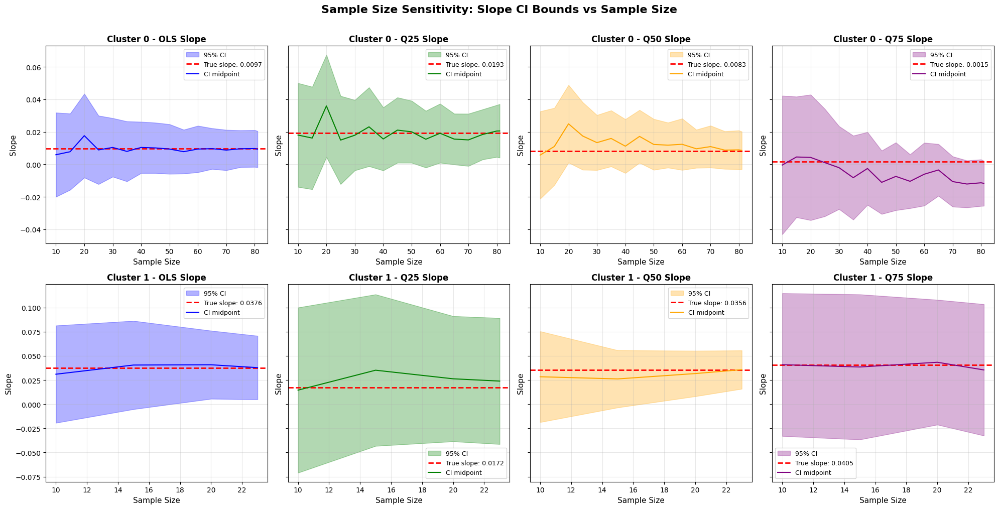

✓ Slope CI vs Sample Size plot saved!


In [25]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# PLOT 1: CI BOUNDS VS SAMPLE SIZE (SLOPE PARAMETER)
# ============================================================================
# Shows how the lower and upper CI bounds for the slope parameter converge
# to the true parameter as sample size increases

n_clusters = len(sensitivity_results)
fig, axes = plt.subplots(n_clusters, 4, figsize=(20, 5 * n_clusters), sharey='row')

if n_clusters == 1:
    axes = axes.reshape(1, -1)

for idx, cluster_id in enumerate(sorted(sensitivity_results.keys())):
    sens = sensitivity_results[cluster_id]
    sample_sizes = sens['sample_sizes']
    true_params = sens['true_params']
    
    # OLS slope
    ax = axes[idx, 0]
    true_slope = true_params['ols']['point_slope']
    ax.fill_between(sample_sizes, sens['ols']['slope_ci_low'], sens['ols']['slope_ci_high'], 
                    alpha=0.3, color='blue', label='95% CI')
    ax.axhline(true_slope, color='red', linestyle='--', linewidth=2, label=f'True slope: {true_slope:.4f}')
    ax.plot(sample_sizes, [(l + h) / 2 for l, h in zip(sens['ols']['slope_ci_low'], sens['ols']['slope_ci_high'])],
            'b-', linewidth=1.5, label='CI midpoint')
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('Slope', fontsize=11)
    ax.set_title(f'Cluster {int(cluster_id)} - OLS Slope', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    
    # Quantile regression slopes
    colors = ['green', 'orange', 'purple']
    for q_idx, q in enumerate(KEY_QUANTILES):
        ax = axes[idx, q_idx + 1]
        true_slope = true_params[q]['point_slope']
        
        ax.fill_between(sample_sizes, sens[q]['slope_ci_low'], sens[q]['slope_ci_high'], 
                        alpha=0.3, color=colors[q_idx], label='95% CI')
        ax.axhline(true_slope, color='red', linestyle='--', linewidth=2, label=f'True slope: {true_slope:.4f}')
        ax.plot(sample_sizes, [(l + h) / 2 for l, h in zip(sens[q]['slope_ci_low'], sens[q]['slope_ci_high'])],
                color=colors[q_idx], linewidth=1.5, label='CI midpoint')
        ax.set_xlabel('Sample Size', fontsize=11)
        ax.set_ylabel('Slope', fontsize=11)
        ax.set_title(f'Cluster {int(cluster_id)} - Q{int(q*100)} Slope', fontsize=12, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

plt.suptitle('Sample Size Sensitivity: Slope CI Bounds vs Sample Size', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(f"{RESULTS_DIR}/figures/05_quantile_regressions/sample_size_sensitivity_slope_ci.png", 
            dpi=150, bbox_inches='tight')
plt.show()

print("✓ Slope CI vs Sample Size plot saved!")

### Visualization: CI Width Convergence

This plot shows how the **CI width** (uncertainty) decreases as sample size increases. Narrower CIs indicate more precise estimates.

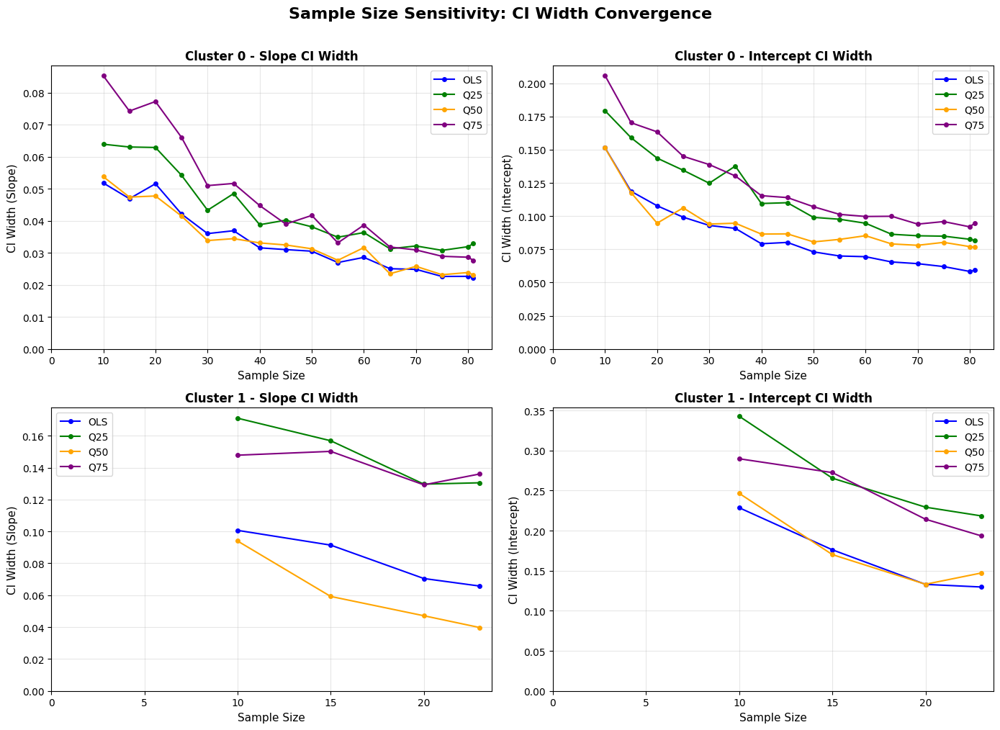

✓ CI Width Convergence plot saved!


In [26]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# PLOT 2: CI WIDTH CONVERGENCE WITH SAMPLE SIZE
# ============================================================================
# Shows how CI width (uncertainty) decreases as sample size increases

n_clusters = len(sensitivity_results)
fig, axes = plt.subplots(n_clusters, 2, figsize=(14, 5 * n_clusters))

if n_clusters == 1:
    axes = axes.reshape(1, -1)

colors_map = {'ols': 'blue', 0.25: 'green', 0.50: 'orange', 0.75: 'purple'}
labels_map = {'ols': 'OLS', 0.25: 'Q25', 0.50: 'Q50', 0.75: 'Q75'}

for idx, cluster_id in enumerate(sorted(sensitivity_results.keys())):
    sens = sensitivity_results[cluster_id]
    sample_sizes = sens['sample_sizes']
    
    # Slope CI width
    ax = axes[idx, 0]
    ax.plot(sample_sizes, sens['ols']['slope_width'], '-o', color=colors_map['ols'], 
            markersize=4, linewidth=1.5, label=labels_map['ols'])
    for q in KEY_QUANTILES:
        ax.plot(sample_sizes, sens[q]['slope_width'], '-o', color=colors_map[q], 
                markersize=4, linewidth=1.5, label=labels_map[q])
    
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('CI Width (Slope)', fontsize=11)
    ax.set_title(f'Cluster {int(cluster_id)} - Slope CI Width', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)
    
    # Intercept CI width
    ax = axes[idx, 1]
    ax.plot(sample_sizes, sens['ols']['int_width'], '-o', color=colors_map['ols'], 
            markersize=4, linewidth=1.5, label=labels_map['ols'])
    for q in KEY_QUANTILES:
        ax.plot(sample_sizes, sens[q]['int_width'], '-o', color=colors_map[q], 
                markersize=4, linewidth=1.5, label=labels_map[q])
    
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('CI Width (Intercept)', fontsize=11)
    ax.set_title(f'Cluster {int(cluster_id)} - Intercept CI Width', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)

plt.suptitle('Sample Size Sensitivity: CI Width Convergence', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(f"{RESULTS_DIR}/figures/05_quantile_regressions/sample_size_sensitivity_ci_width.png", 
            dpi=150, bbox_inches='tight')
plt.show()

print("✓ CI Width Convergence plot saved!")

### Minimum Sample Size to Cover True Parameters

This analysis identifies the **minimum sample size** at which the wild bootstrap CI consistently covers the "true" parameter (estimated from the full sample). This provides practical guidance on the minimum number of sites needed for reliable inference.

In [27]:
import pandas as pd
import numpy as np

# ============================================================================
# MINIMUM SAMPLE SIZE ANALYSIS
# ============================================================================
# Find the minimum sample size where CI covers the true parameter
# Report summary statistics for each cluster and model type

min_sample_summary = []

for cluster_id in sorted(sensitivity_results.keys()):
    sens = sensitivity_results[cluster_id]
    sample_sizes = np.array(sens['sample_sizes'])
    n_full = sample_sizes[-1]
    
    # Find minimum sample size for consistent coverage (true param within CI)
    def find_min_coverage_size(covers_list, sample_sizes):
        """Find smallest sample size from which CI consistently covers true param."""
        covers = np.array(covers_list)
        # Look for the smallest sample size after which coverage is stable
        for i, n in enumerate(sample_sizes):
            # Check if coverage is true from this point onwards (at least 80% of remaining)
            remaining_coverage = covers[i:]
            if len(remaining_coverage) > 0 and np.mean(remaining_coverage) >= 0.8:
                return n
        return sample_sizes[-1]  # Default to full sample if no stable coverage found
    
    # OLS
    min_ols_slope = find_min_coverage_size(sens['ols']['covers_true_slope'], sample_sizes)
    min_ols_int = find_min_coverage_size(sens['ols']['covers_true_int'], sample_sizes)
    
    min_sample_summary.append({
        'Cluster': int(cluster_id),
        'Model': 'OLS',
        'Min n (Slope)': min_ols_slope,
        'Min n (Intercept)': min_ols_int,
        'Full n': n_full,
        'Slope Coverage Rate': np.mean(sens['ols']['covers_true_slope']) * 100,
        'Intercept Coverage Rate': np.mean(sens['ols']['covers_true_int']) * 100,
    })
    
    # Quantile regressions
    for q in KEY_QUANTILES:
        min_qr_slope = find_min_coverage_size(sens[q]['covers_true_slope'], sample_sizes)
        min_qr_int = find_min_coverage_size(sens[q]['covers_true_int'], sample_sizes)
        
        min_sample_summary.append({
            'Cluster': int(cluster_id),
            'Model': f'Q{int(q*100)}',
            'Min n (Slope)': min_qr_slope,
            'Min n (Intercept)': min_qr_int,
            'Full n': n_full,
            'Slope Coverage Rate': np.mean(sens[q]['covers_true_slope']) * 100,
            'Intercept Coverage Rate': np.mean(sens[q]['covers_true_int']) * 100,
        })

# Create summary DataFrame
min_sample_df = pd.DataFrame(min_sample_summary)

print("="*80)
print("MINIMUM SAMPLE SIZE FOR RELIABLE CI COVERAGE")
print("="*80)
print("\nThis table shows the minimum sample size needed for the wild bootstrap CI")
print("to reliably cover the 'true' parameter (from full sample).\n")

display(min_sample_df.style.format({
    'Min n (Slope)': '{:.0f}',
    'Min n (Intercept)': '{:.0f}',
    'Full n': '{:.0f}',
    'Slope Coverage Rate': '{:.1f}%',
    'Intercept Coverage Rate': '{:.1f}%'
}).set_caption('Minimum Sample Size for CI Coverage of True Parameters'))

# Summary statistics
print("\n" + "="*80)
print("SUMMARY BY MODEL TYPE")
print("="*80)
for model in ['OLS', 'Q25', 'Q50', 'Q75']:
    model_df = min_sample_df[min_sample_df['Model'] == model]
    avg_min_slope = model_df['Min n (Slope)'].mean()
    avg_min_int = model_df['Min n (Intercept)'].mean()
    avg_full = model_df['Full n'].mean()
    print(f"\n{model}:")
    print(f"  Avg min sample size (slope): {avg_min_slope:.0f} sites ({avg_min_slope/avg_full*100:.1f}% of full)")
    print(f"  Avg min sample size (intercept): {avg_min_int:.0f} sites ({avg_min_int/avg_full*100:.1f}% of full)")

MINIMUM SAMPLE SIZE FOR RELIABLE CI COVERAGE

This table shows the minimum sample size needed for the wild bootstrap CI
to reliably cover the 'true' parameter (from full sample).



,Cluster,Model,Min n (Slope),Min n (Intercept),Full n,Slope Coverage Rate,Intercept Coverage Rate
0,0,OLS,10,10,81,100.0%,100.0%
1,0,Q25,10,81,81,100.0%,12.5%
2,0,Q50,10,10,81,100.0%,100.0%
3,0,Q75,10,81,81,100.0%,18.8%
4,1,OLS,10,10,23,100.0%,100.0%
5,1,Q25,10,10,23,100.0%,100.0%
6,1,Q50,10,10,23,100.0%,100.0%
7,1,Q75,10,10,23,100.0%,100.0%



SUMMARY BY MODEL TYPE

OLS:
  Avg min sample size (slope): 10 sites (19.2% of full)
  Avg min sample size (intercept): 10 sites (19.2% of full)

Q25:
  Avg min sample size (slope): 10 sites (19.2% of full)
  Avg min sample size (intercept): 46 sites (87.5% of full)

Q50:
  Avg min sample size (slope): 10 sites (19.2% of full)
  Avg min sample size (intercept): 10 sites (19.2% of full)

Q75:
  Avg min sample size (slope): 10 sites (19.2% of full)
  Avg min sample size (intercept): 46 sites (87.5% of full)


### Visualization: Intercept CI Bounds vs Sample Size

Similar to the slope analysis, this shows how the intercept CI bounds converge to the true intercept parameter.

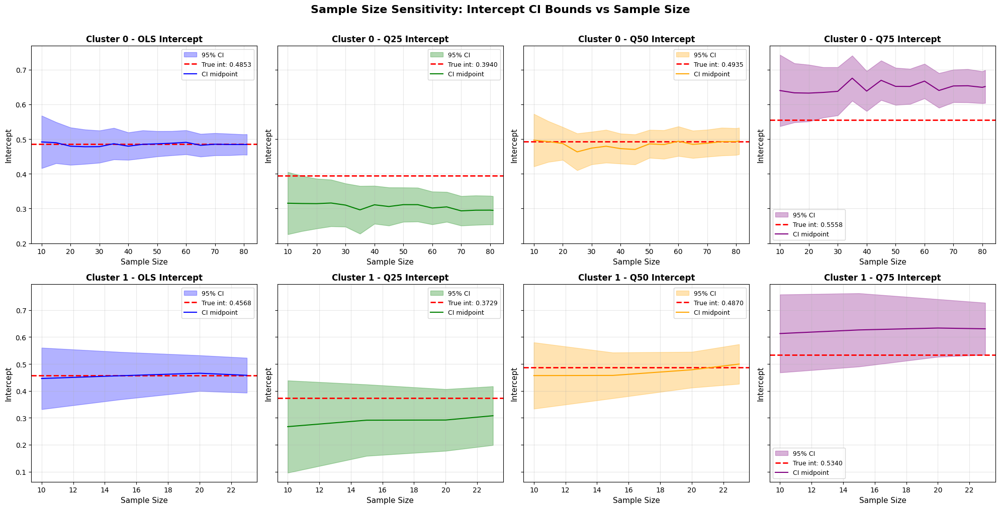

✓ Intercept CI vs Sample Size plot saved!


In [28]:
import matplotlib.pyplot as plt
import numpy as np

# ============================================================================
# PLOT 3: CI BOUNDS VS SAMPLE SIZE (INTERCEPT PARAMETER)
# ============================================================================

n_clusters = len(sensitivity_results)
fig, axes = plt.subplots(n_clusters, 4, figsize=(20, 5 * n_clusters), sharey='row')

if n_clusters == 1:
    axes = axes.reshape(1, -1)

for idx, cluster_id in enumerate(sorted(sensitivity_results.keys())):
    sens = sensitivity_results[cluster_id]
    sample_sizes = sens['sample_sizes']
    true_params = sens['true_params']
    
    # OLS intercept
    ax = axes[idx, 0]
    true_int = true_params['ols']['point_int']
    ax.fill_between(sample_sizes, sens['ols']['int_ci_low'], sens['ols']['int_ci_high'], 
                    alpha=0.3, color='blue', label='95% CI')
    ax.axhline(true_int, color='red', linestyle='--', linewidth=2, label=f'True int: {true_int:.4f}')
    ax.plot(sample_sizes, [(l + h) / 2 for l, h in zip(sens['ols']['int_ci_low'], sens['ols']['int_ci_high'])],
            'b-', linewidth=1.5, label='CI midpoint')
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('Intercept', fontsize=11)
    ax.set_title(f'Cluster {int(cluster_id)} - OLS Intercept', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    
    # Quantile regression intercepts
    colors = ['green', 'orange', 'purple']
    for q_idx, q in enumerate(KEY_QUANTILES):
        ax = axes[idx, q_idx + 1]
        true_int = true_params[q]['point_int']
        
        ax.fill_between(sample_sizes, sens[q]['int_ci_low'], sens[q]['int_ci_high'], 
                        alpha=0.3, color=colors[q_idx], label='95% CI')
        ax.axhline(true_int, color='red', linestyle='--', linewidth=2, label=f'True int: {true_int:.4f}')
        ax.plot(sample_sizes, [(l + h) / 2 for l, h in zip(sens[q]['int_ci_low'], sens[q]['int_ci_high'])],
                color=colors[q_idx], linewidth=1.5, label='CI midpoint')
        ax.set_xlabel('Sample Size', fontsize=11)
        ax.set_ylabel('Intercept', fontsize=11)
        ax.set_title(f'Cluster {int(cluster_id)} - Q{int(q*100)} Intercept', fontsize=12, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

plt.suptitle('Sample Size Sensitivity: Intercept CI Bounds vs Sample Size', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(f"{RESULTS_DIR}/figures/05_quantile_regressions/sample_size_sensitivity_intercept_ci.png", 
            dpi=150, bbox_inches='tight')
plt.show()

print("✓ Intercept CI vs Sample Size plot saved!")

### Combined Summary Plot: CI Dynamics Across All Models

This comprehensive figure combines slope CI bounds, intercept CI bounds, and CI width for each cluster in a single visualization.

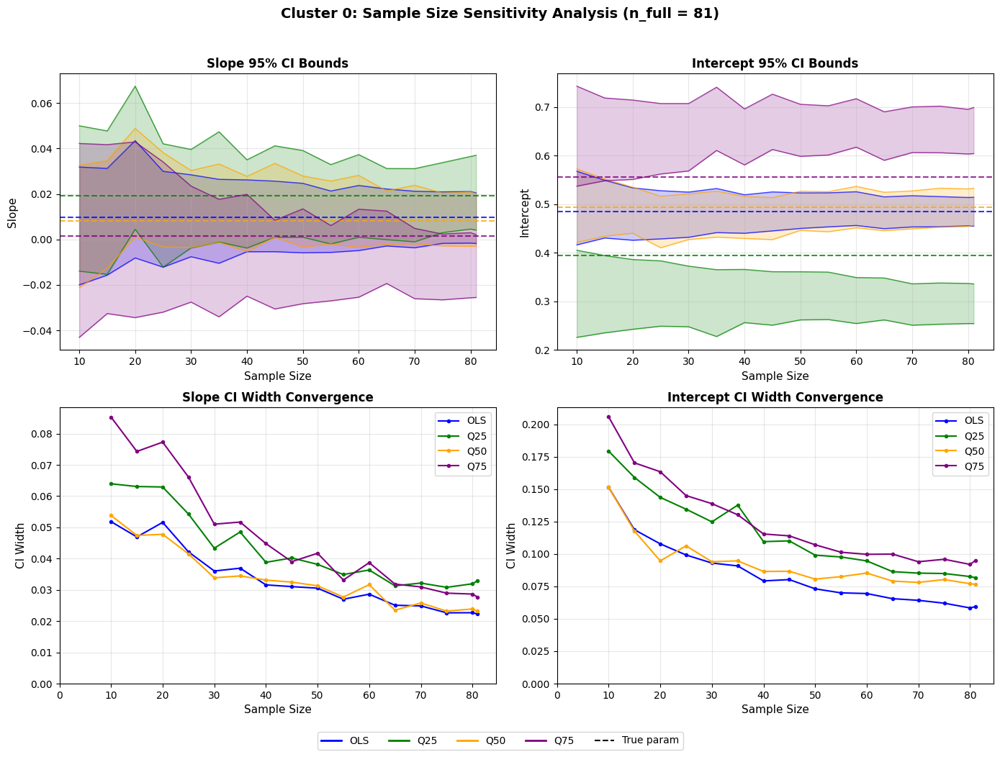

✓ Combined plot saved for Cluster 0


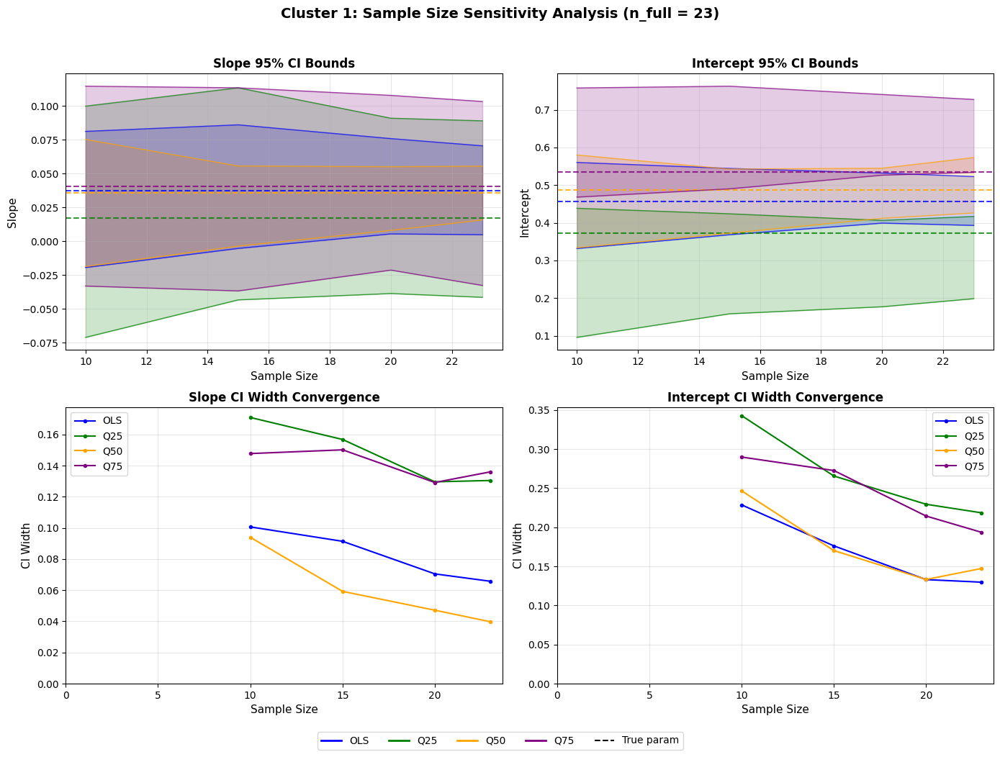

✓ Combined plot saved for Cluster 1

✓ All Sample Size Sensitivity Analysis Plots Generated!


In [29]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D

# ============================================================================
# COMBINED SUMMARY FIGURE: ALL MODELS PER CLUSTER
# ============================================================================
# For each cluster, create a comprehensive 2x2 figure showing:
# - Top left: All slope CIs (shaded bands)
# - Top right: All intercept CIs (shaded bands)  
# - Bottom left: Slope CI width convergence
# - Bottom right: Intercept CI width convergence

colors_map = {'ols': 'blue', 0.25: 'green', 0.50: 'orange', 0.75: 'purple'}
labels_map = {'ols': 'OLS', 0.25: 'Q25', 0.50: 'Q50', 0.75: 'Q75'}

for cluster_id in sorted(sensitivity_results.keys()):
    sens = sensitivity_results[cluster_id]
    sample_sizes = sens['sample_sizes']
    true_params = sens['true_params']
    n_full = sample_sizes[-1]
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # ===== TOP LEFT: Slope CI Bounds =====
    ax = axes[0, 0]
    models = ['ols'] + KEY_QUANTILES
    for model in models:
        c = colors_map[model]
        ax.fill_between(sample_sizes, sens[model]['slope_ci_low'], sens[model]['slope_ci_high'], 
                        alpha=0.2, color=c)
        ax.plot(sample_sizes, sens[model]['slope_ci_low'], '-', color=c, linewidth=1, alpha=0.7)
        ax.plot(sample_sizes, sens[model]['slope_ci_high'], '-', color=c, linewidth=1, alpha=0.7)
        true_slope = true_params[model]['point_slope']
        ax.axhline(true_slope, color=c, linestyle='--', linewidth=1.5, alpha=0.8)
    
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('Slope', fontsize=11)
    ax.set_title('Slope 95% CI Bounds', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # ===== TOP RIGHT: Intercept CI Bounds =====
    ax = axes[0, 1]
    for model in models:
        c = colors_map[model]
        ax.fill_between(sample_sizes, sens[model]['int_ci_low'], sens[model]['int_ci_high'], 
                        alpha=0.2, color=c)
        ax.plot(sample_sizes, sens[model]['int_ci_low'], '-', color=c, linewidth=1, alpha=0.7)
        ax.plot(sample_sizes, sens[model]['int_ci_high'], '-', color=c, linewidth=1, alpha=0.7)
        true_int = true_params[model]['point_int']
        ax.axhline(true_int, color=c, linestyle='--', linewidth=1.5, alpha=0.8)
    
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('Intercept', fontsize=11)
    ax.set_title('Intercept 95% CI Bounds', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    # ===== BOTTOM LEFT: Slope CI Width =====
    ax = axes[1, 0]
    for model in models:
        ax.plot(sample_sizes, sens[model]['slope_width'], '-o', color=colors_map[model], 
                markersize=3, linewidth=1.5, label=labels_map[model])
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('CI Width', fontsize=11)
    ax.set_title('Slope CI Width Convergence', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)
    
    # ===== BOTTOM RIGHT: Intercept CI Width =====
    ax = axes[1, 1]
    for model in models:
        ax.plot(sample_sizes, sens[model]['int_width'], '-o', color=colors_map[model], 
                markersize=3, linewidth=1.5, label=labels_map[model])
    ax.set_xlabel('Sample Size', fontsize=11)
    ax.set_ylabel('CI Width', fontsize=11)
    ax.set_title('Intercept CI Width Convergence', fontsize=12, fontweight='bold')
    ax.legend(loc='best', fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)
    
    # Add legend for CI bounds plots
    legend_elements = [Line2D([0], [0], color=colors_map[m], linewidth=2, label=labels_map[m]) 
                       for m in models]
    legend_elements.append(Line2D([0], [0], color='black', linestyle='--', linewidth=1.5, label='True param'))
    fig.legend(handles=legend_elements, loc='upper center', ncol=5, fontsize=10, 
               bbox_to_anchor=(0.5, 0.02))
    
    plt.suptitle(f'Cluster {int(cluster_id)}: Sample Size Sensitivity Analysis (n_full = {n_full})', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.08)
    plt.savefig(f"{RESULTS_DIR}/figures/05_quantile_regressions/sample_size_sensitivity_cluster_{int(cluster_id)}_combined.png", 
                dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"✓ Combined plot saved for Cluster {int(cluster_id)}")

print("\n" + "="*70)
print("✓ All Sample Size Sensitivity Analysis Plots Generated!")
print("="*70)